In [1]:
import pandas as pd

In [2]:
import torch.nn.functional as F

from torch import Tensor
from transformers import AutoTokenizer, AutoModel
from tqdm import tqdm
import pymupdf

In [3]:
def get_text_with_links(document):
    result_text = ""
    
    for page_num in range(len(document)):
        page = document.load_page(page_num)

        # Получаем слова и их координаты
        words = page.get_text("words")
        links = page.get_links()

        # Временный словарь для отслеживания последнего индекса слова для каждого URL
        last_occurrence_with_url = {}

        wc_map = {tuple(word[:4]): word[4] for word in words}
        
        for link in links:
            link_rect = pymupdf.Rect(link["from"])
            uri = link.get('uri', 'Нет ссылки')
            
            for i, word in enumerate(words):
                text = word[4]   # текст слова
                word_rect = pymupdf.Rect(word[:4])

                # Проверка на пересечение координат
                if word_rect.intersects(link_rect):
                    last_occurrence_with_url[uri] = (i, tuple(word[:4]))

        # Заменяем текст в конечном словаре ссылками на последних вхождениях
        for uri, (index, rect) in last_occurrence_with_url.items():
            wc_map[rect] = f'{wc_map[rect]}:"{uri}"'

        # Сортировка слов по их координатам для правильного порядка
        sorted_words = sorted(wc_map.items(), key=lambda x: (x[0][1], x[0][0]))

        for item in sorted_words:
            result_text += item[1] + " "
    
    return result_text.strip()  # добавляем strip для удаления лишних пробелов в конце

In [6]:
df = pd.read_csv('/root/docker_llama/interns_preprocessed_multiclass/interns_preprocessed_multiclass.csv', encoding='utf-8').dropna().reset_index(drop=True)

<Axes: ylabel='Frequency'>

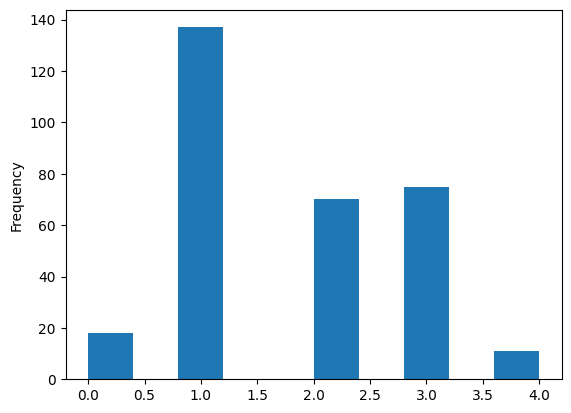

In [7]:
df['Hire status'].plot(kind='hist')

In [8]:
df['text']=None
df['embedding']=None

In [9]:
df['Резюме'] = df['Резюме'].apply(lambda x: '/root/docker_llama/'+x)

In [23]:
for i, pdf_file in enumerate(tqdm(df['Резюме'])):
    pdf_file = pdf_file.replace('\\', '/')
    #print(pdf_file)
    try:
        with pymupdf.open(pdf_file) as doc:
            text = get_text_with_links(doc)
    except:
        print('битый файл')
        continue
    
    df.loc[i, ['text']] = [text]

  4%|▎         | 11/311 [00:00<00:06, 45.53it/s]

битый файл


 64%|██████▍   | 199/311 [00:05<00:02, 39.91it/s]

битый файл


 75%|███████▍  | 233/311 [00:06<00:01, 41.34it/s]

битый файл


 83%|████████▎ | 257/311 [00:07<00:01, 35.54it/s]

битый файл


100%|██████████| 311/311 [00:09<00:00, 34.53it/s]

битый файл


In [24]:
df['label'] = df['Hire status']

In [25]:
df = df.dropna().reset_index(drop=True)

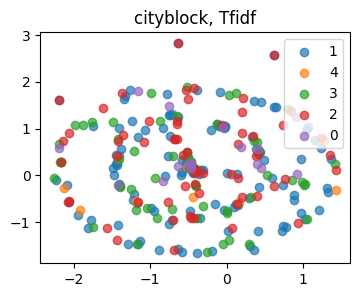

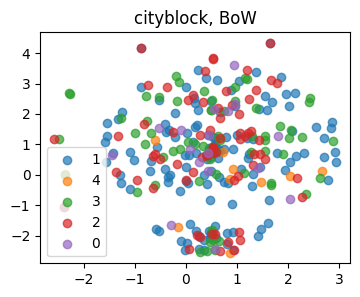

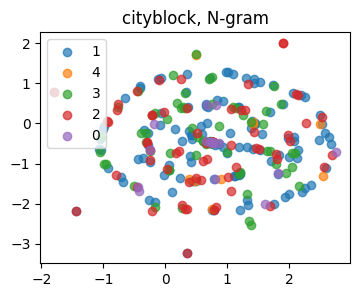

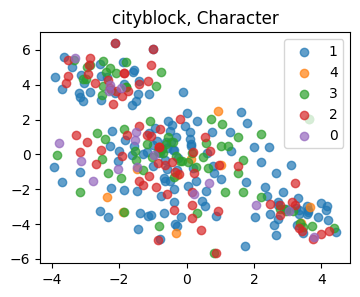

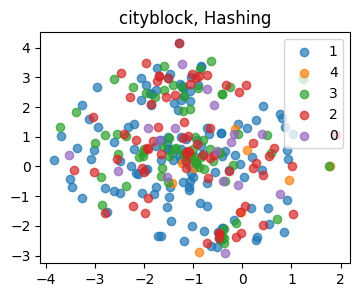

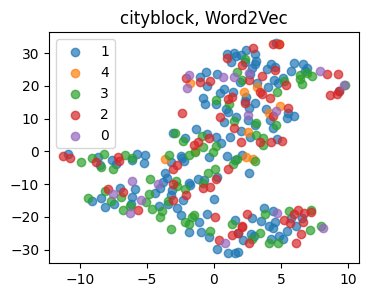

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


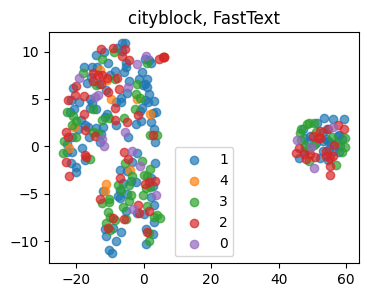

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


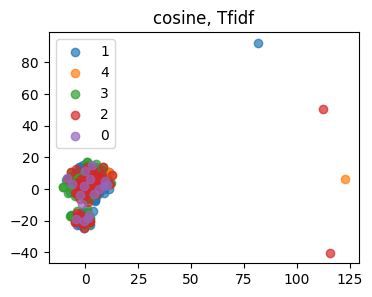

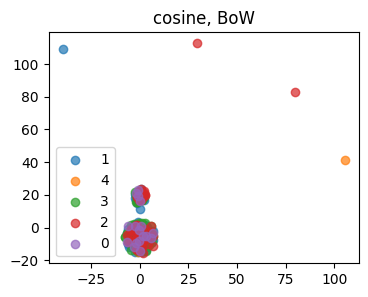

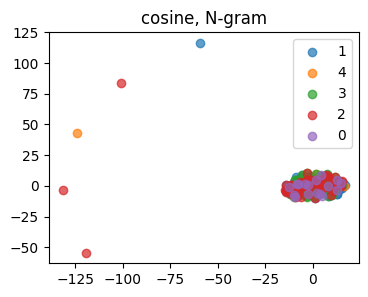

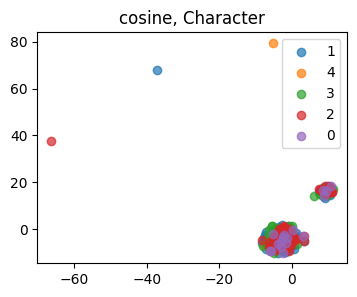

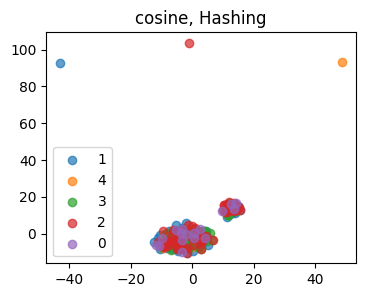

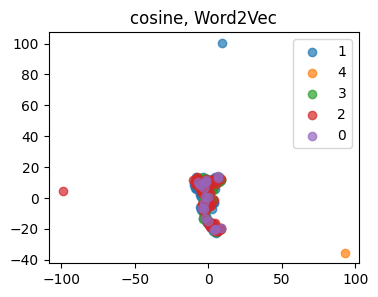

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


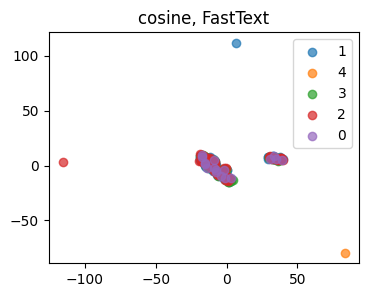

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


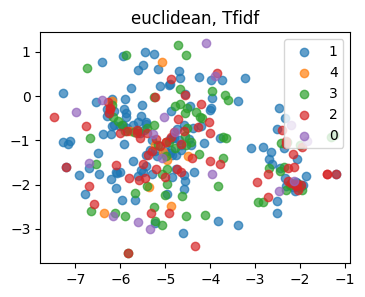

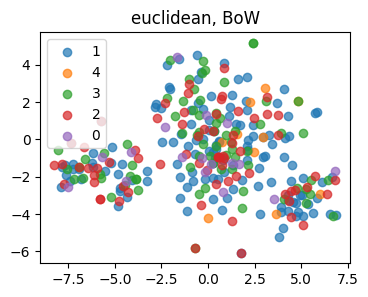

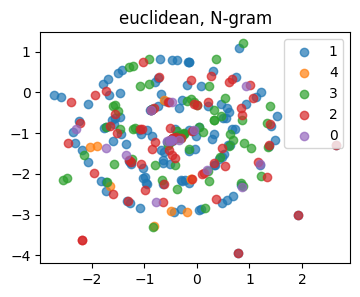

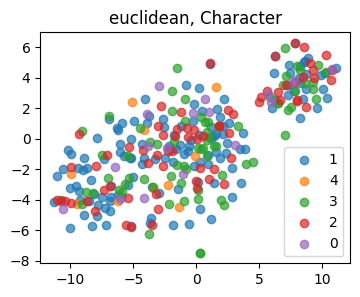

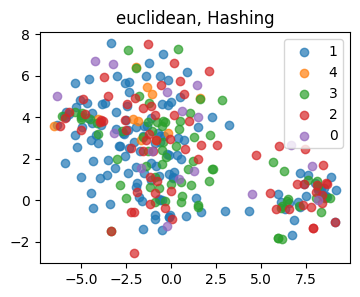

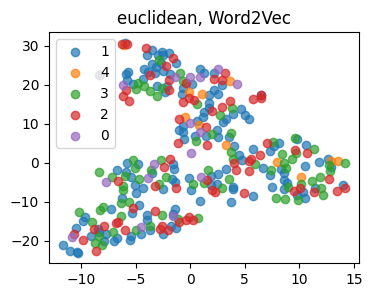

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


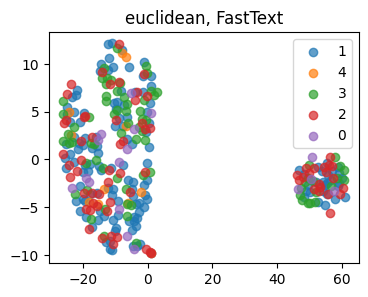

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


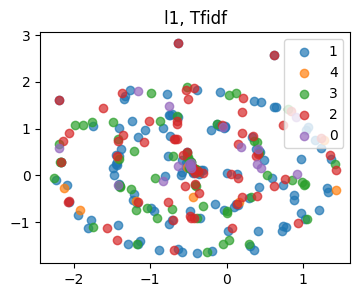

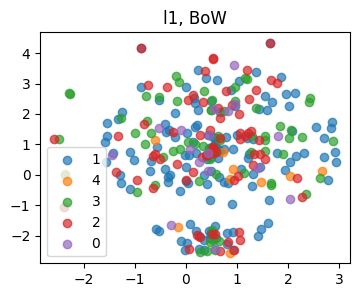

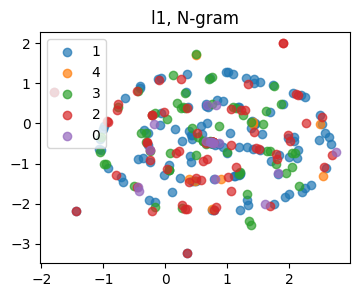

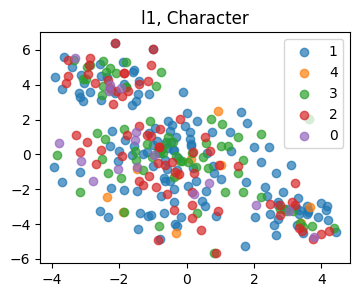

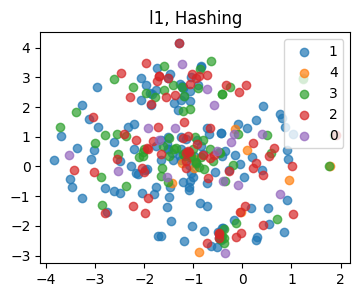

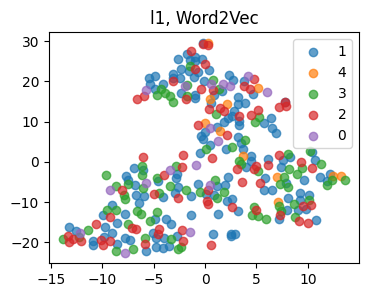

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


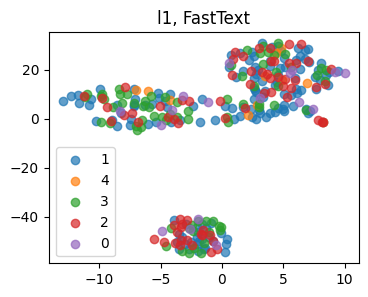

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


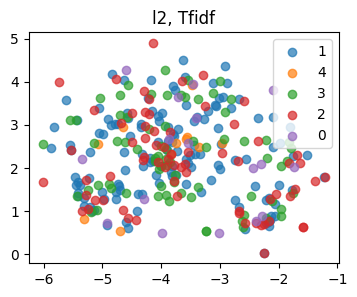

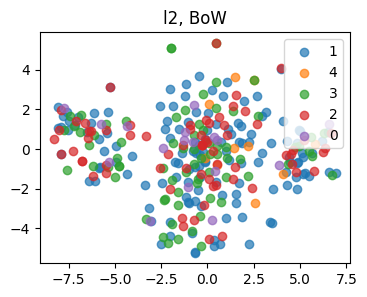

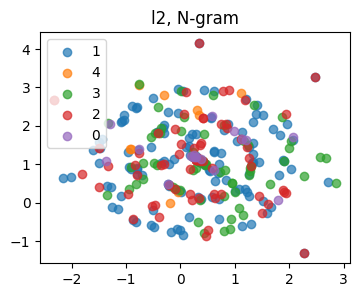

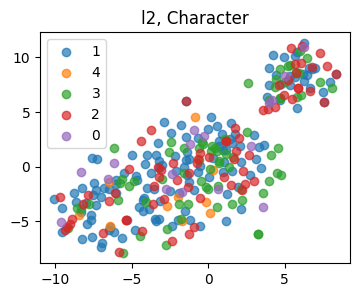

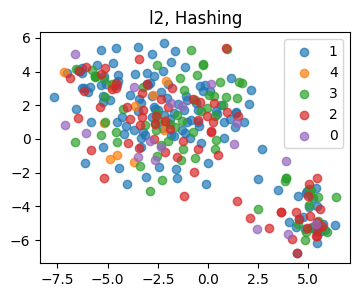

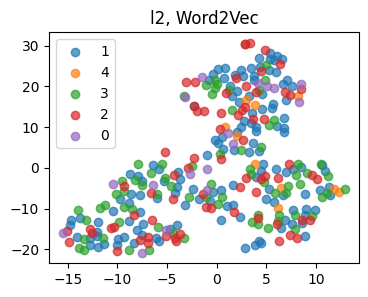

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


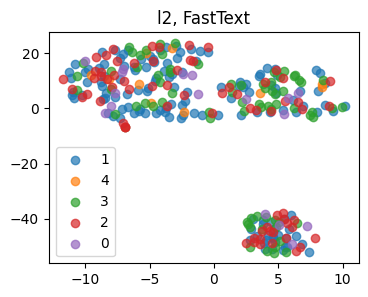

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


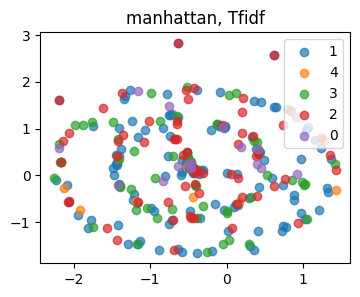

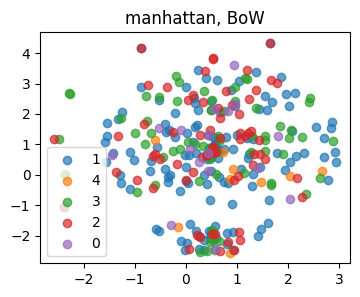

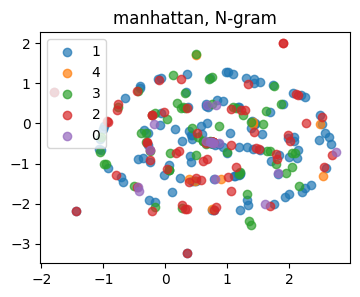

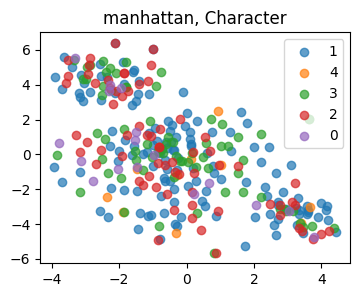

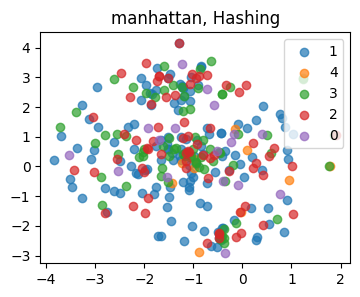

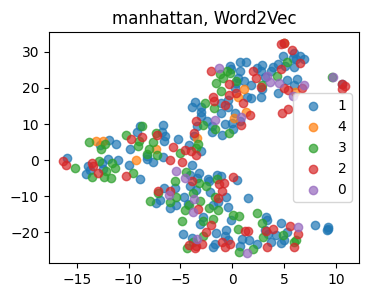

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


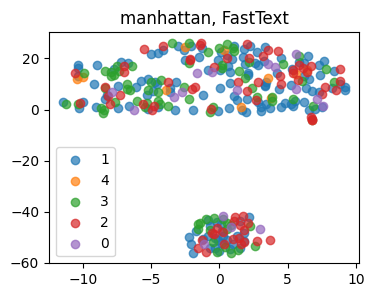

In [109]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from gensim.models import Word2Vec, FastText
from sklearn.feature_extraction.text import CountVectorizer, HashingVectorizer, TfidfVectorizer
from gensim.utils import simple_preprocess

def get_document_vectors(model, sentences):
    document_vectors = []
    for sentence in sentences:
        words = [word for word in sentence if word in model.wv]
        if words:
            document_vectors.append(np.mean(model.wv[words], axis=0))
        else:
            document_vectors.append(np.zeros(model.vector_size))
    return np.array(document_vectors)

for curmetric in ['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan']:
    tsne = TSNE(init="random", random_state=42, n_iter=10000, metric=curmetric)
    
    for vectorizer_name in ['Tfidf', 'BoW', 'N-gram', 'Character', 'Hashing', 'Word2Vec', 'FastText']:
        if vectorizer_name == 'Tfidf':
            vectorizer = TfidfVectorizer()
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'BoW':
            vectorizer = CountVectorizer()
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'N-gram':
            vectorizer = CountVectorizer(ngram_range=(2, 3))  # биграммы и триграммы
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'Character':
            vectorizer = CountVectorizer(analyzer='char', ngram_range=(3, 3))  # Например, для trigrams
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'Hashing':
            vectorizer = HashingVectorizer(n_features=2**10)
            X = vectorizer.transform(df['text'])
        elif vectorizer_name == 'Word2Vec':
            sentences = [simple_preprocess(text) for text in df['text']]
            model = Word2Vec(sentences, vector_size=100, window=5, min_count=1, workers=4)
            X = get_document_vectors(model, sentences)
        elif vectorizer_name == 'FastText':
            sentences = [simple_preprocess(text) for text in df['text']]
            model = FastText(sentences, vector_size=100, window=5, min_count=1, workers=4)
            X = get_document_vectors(model, sentences)
        
        X_tsne = tsne.fit_transform(X)
        
        # Визуализируйте результаты
        fig, ax = plt.subplots(figsize=(4, 3))
        for label in df['label'].unique():
            subset = df[df['label'] == label]
            ax.scatter(X_tsne[subset.index, 0], X_tsne[subset.index, 1], alpha=0.7, label=label)
        
        plt.title(f'{curmetric}, {vectorizer_name}')
        plt.legend()
        plt.show()

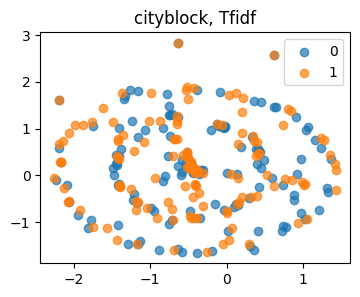

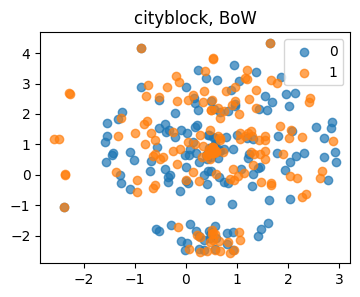

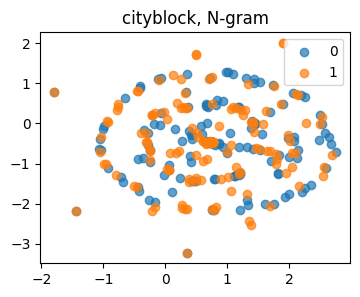

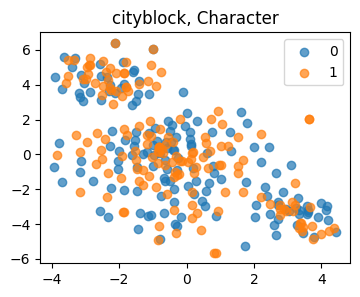

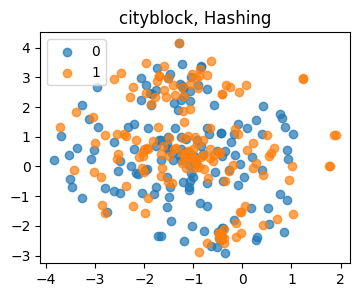

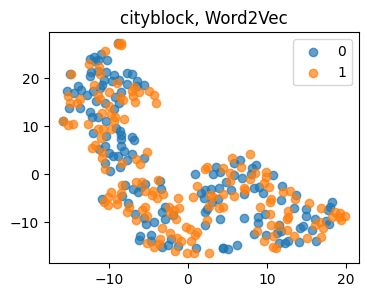

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


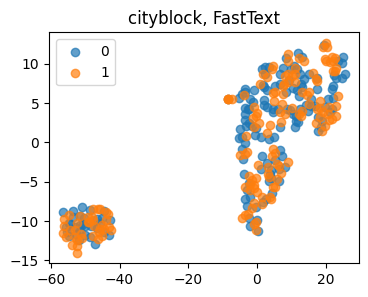

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


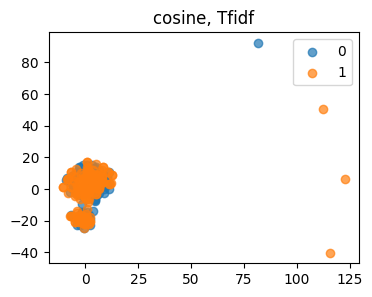

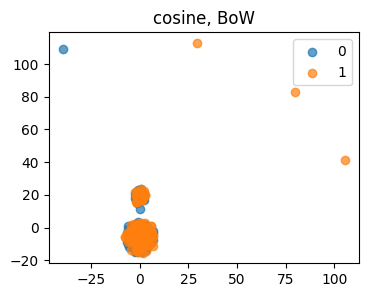

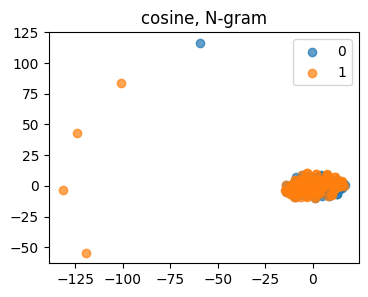

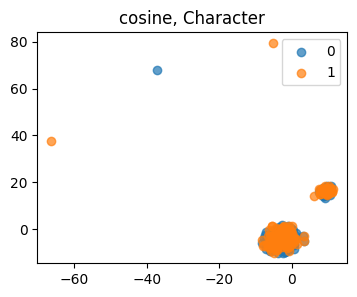

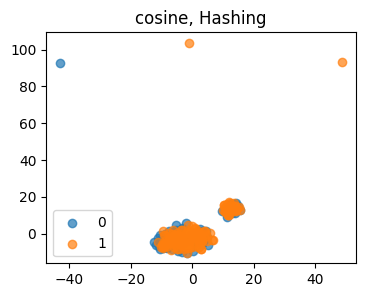

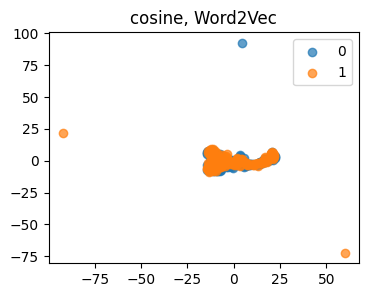

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


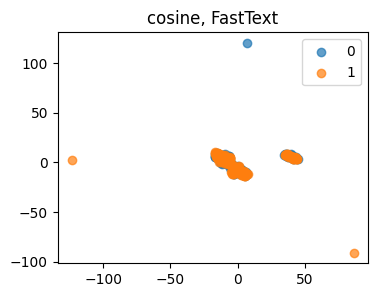

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


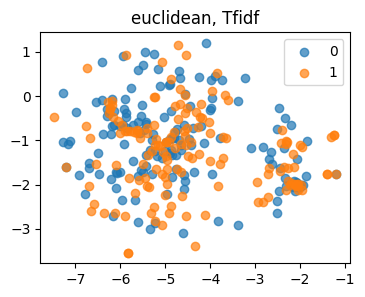

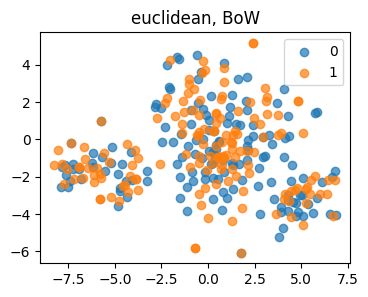

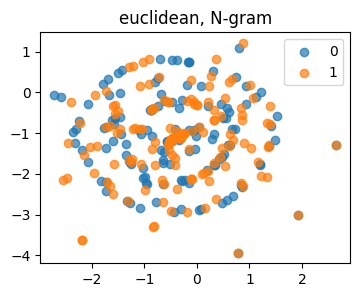

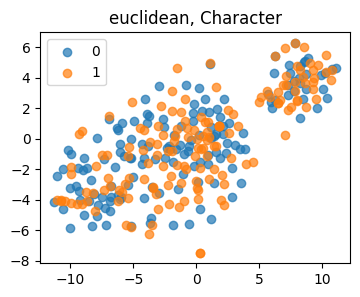

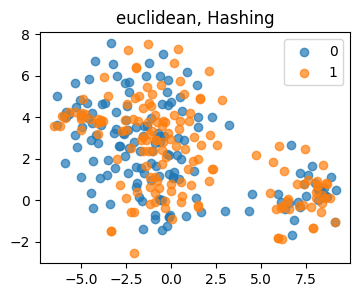

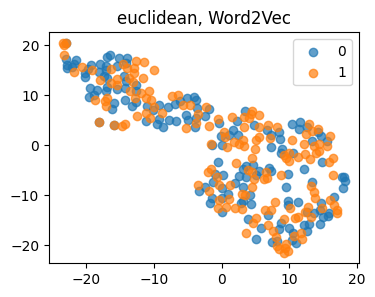

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


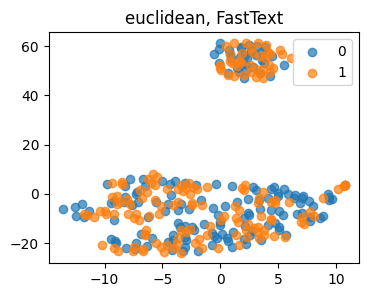

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


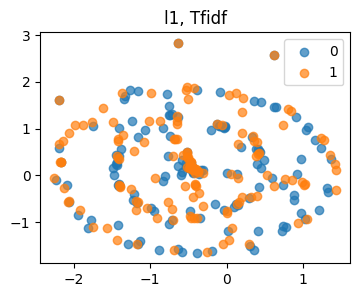

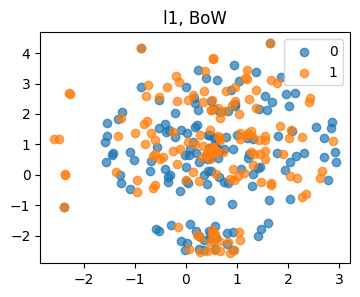

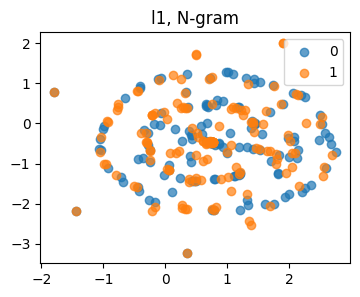

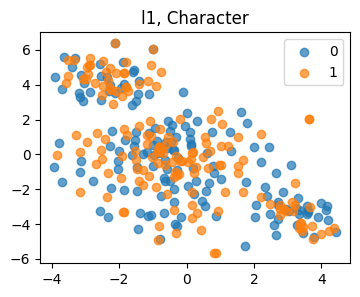

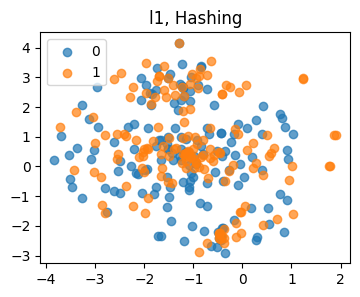

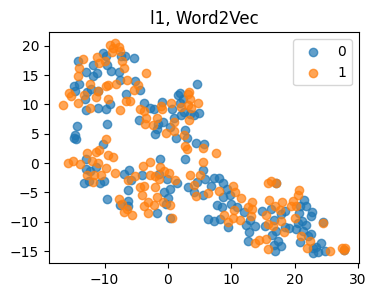

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


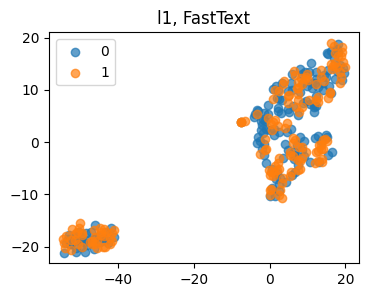

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


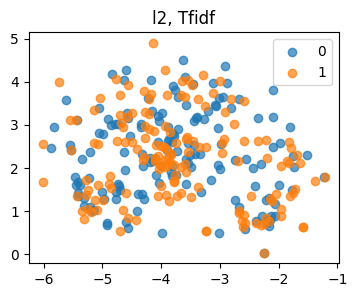

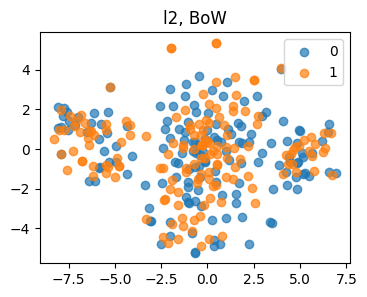

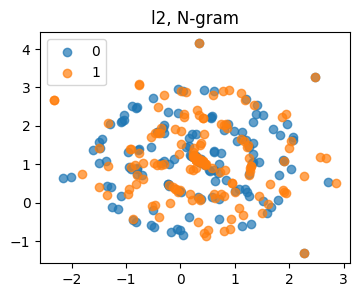

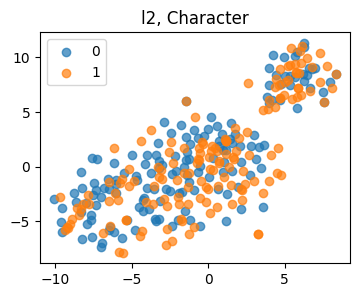

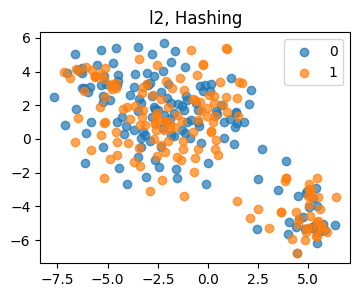

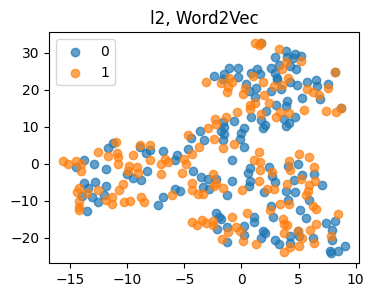

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


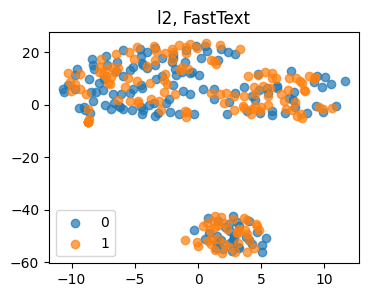

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


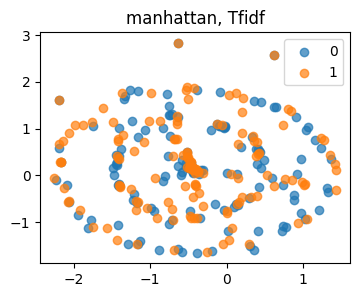

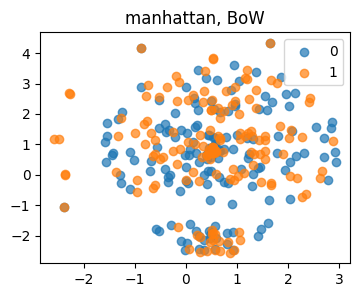

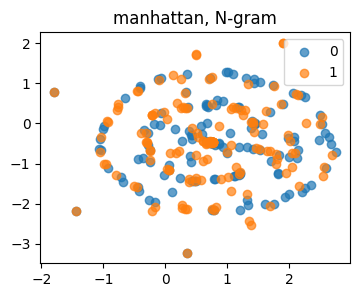

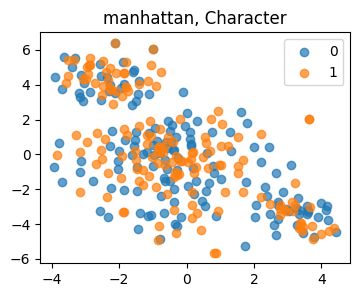

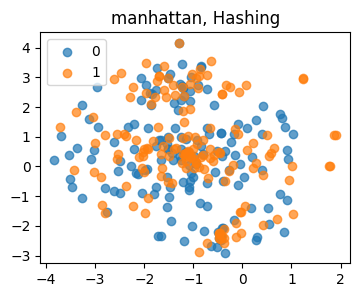

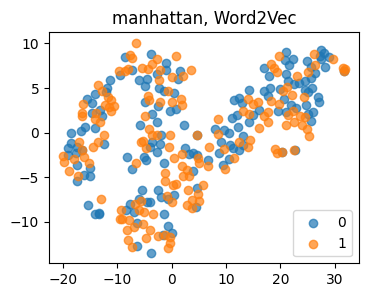

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


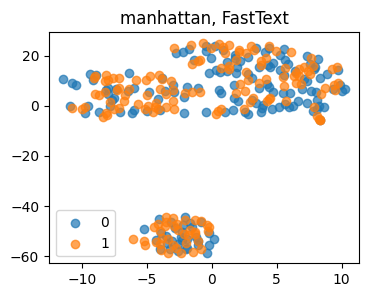

In [115]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from gensim.models import Word2Vec, FastText
from sklearn.feature_extraction.text import CountVectorizer, HashingVectorizer, TfidfVectorizer
from gensim.utils import simple_preprocess

def get_document_vectors(model, sentences):
    document_vectors = []
    for sentence in sentences:
        words = [word for word in sentence if word in model.wv]
        if words:
            document_vectors.append(np.mean(model.wv[words], axis=0))
        else:
            document_vectors.append(np.zeros(model.vector_size))
    return np.array(document_vectors)

for curmetric in ['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan']:
    tsne = TSNE(init="random", random_state=42, n_iter=10000, metric=curmetric)
    
    for vectorizer_name in ['Tfidf', 'BoW', 'N-gram', 'Character', 'Hashing', 'Word2Vec', 'FastText']:
        if vectorizer_name == 'Tfidf':
            vectorizer = TfidfVectorizer()
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'BoW':
            vectorizer = CountVectorizer()
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'N-gram':
            vectorizer = CountVectorizer(ngram_range=(2, 3))  # биграммы и триграммы
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'Character':
            vectorizer = CountVectorizer(analyzer='char', ngram_range=(3, 3))  # Например, для trigrams
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'Hashing':
            vectorizer = HashingVectorizer(n_features=2**10)
            X = vectorizer.transform(df['text'])
        elif vectorizer_name == 'Word2Vec':
            sentences = [simple_preprocess(text) for text in df['text']]
            model = Word2Vec(sentences, vector_size=100, window=5, min_count=1, workers=4)
            X = get_document_vectors(model, sentences)
        elif vectorizer_name == 'FastText':
            sentences = [simple_preprocess(text) for text in df['text']]
            model = FastText(sentences, vector_size=100, window=5, min_count=1, workers=4)
            X = get_document_vectors(model, sentences)
        
        X_tsne = tsne.fit_transform(X)
        
        fig, ax = plt.subplots(figsize=(4, 3))
        for label in [0,1]:
            subset = df[df['label'].apply(lambda x: 0 if x<2 else 1) == label]
            ax.scatter(X_tsne[subset.index, 0], X_tsne[subset.index, 1], alpha=0.7, label=label)
        
        plt.title(f'{curmetric}, {vectorizer_name}')
        plt.legend()
        plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


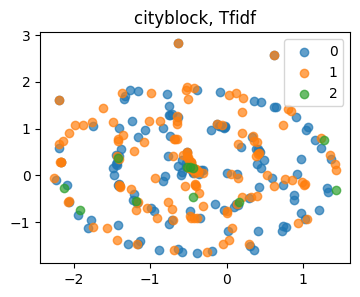

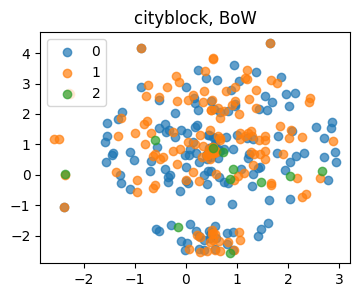

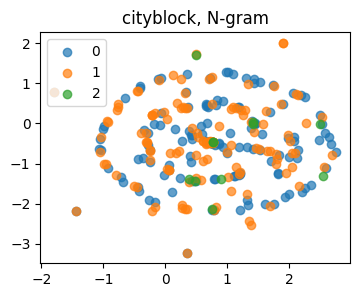

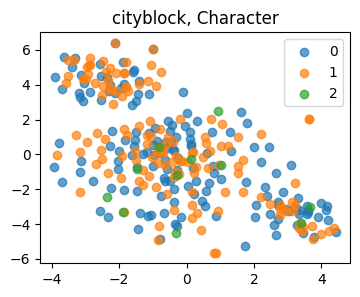

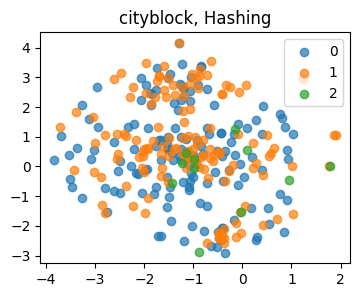

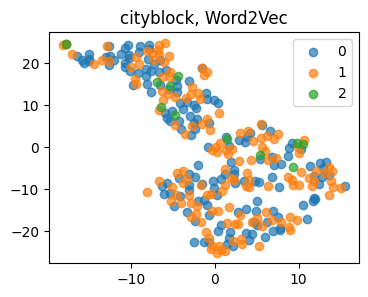

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


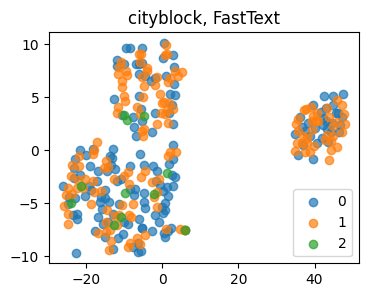

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


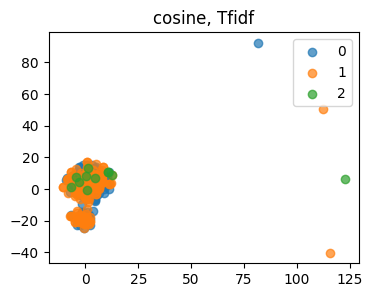

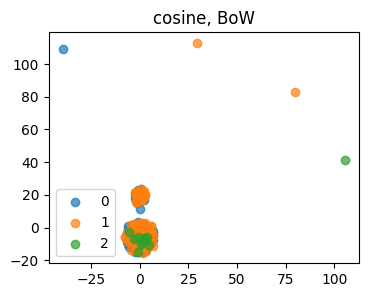

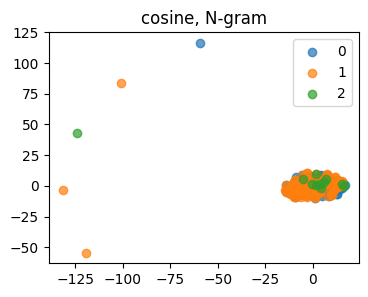

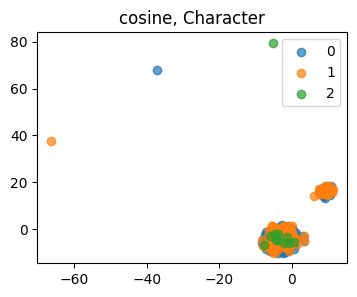

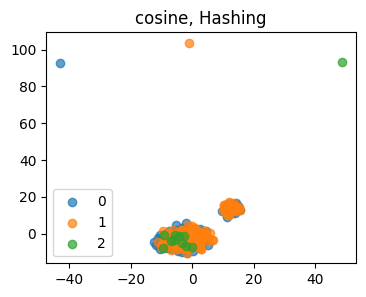

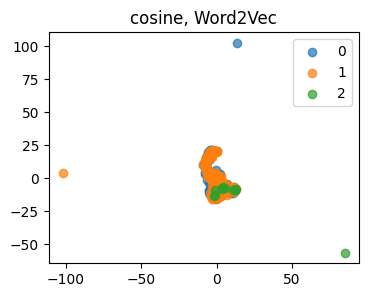

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


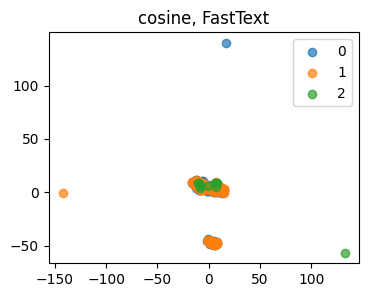

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


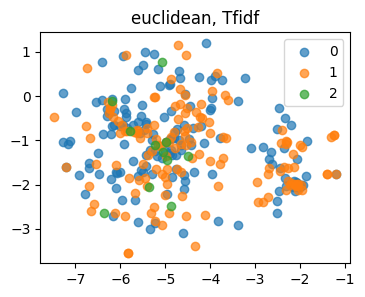

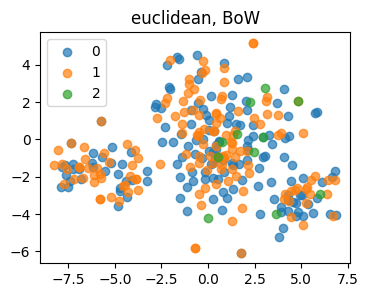

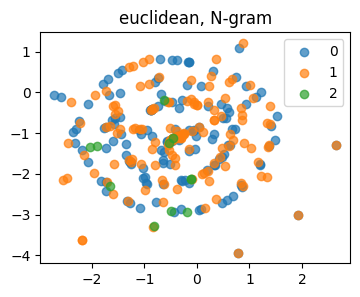

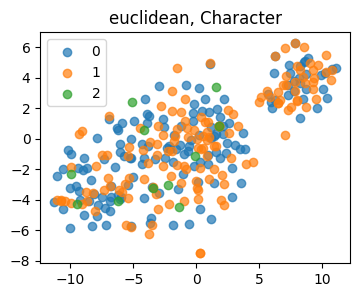

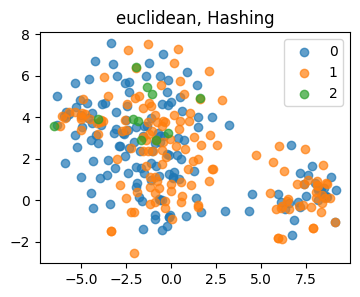

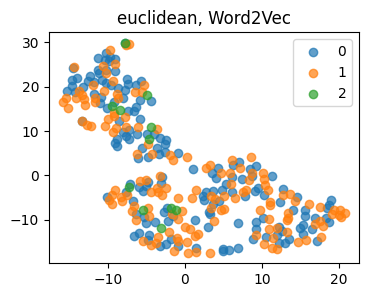

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


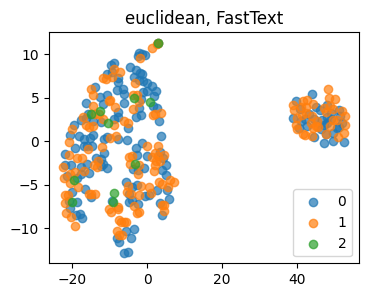

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


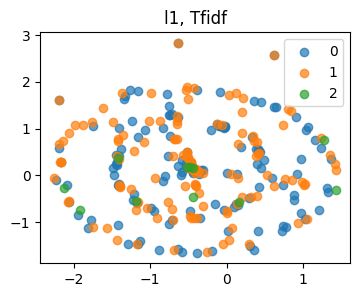

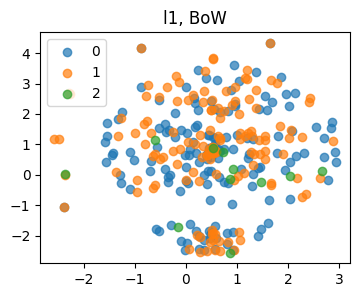

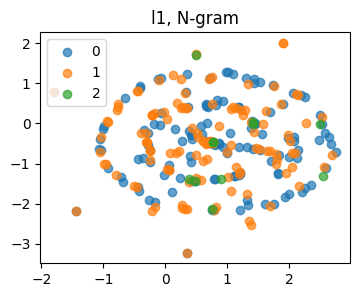

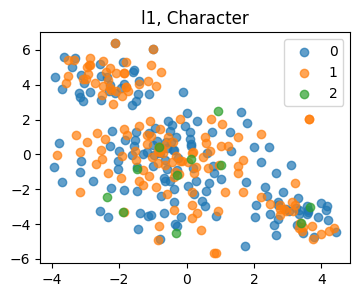

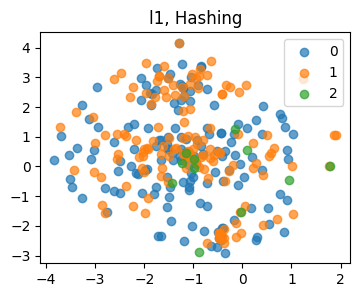

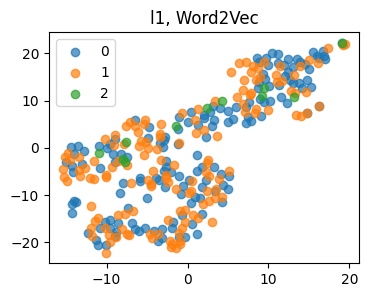

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


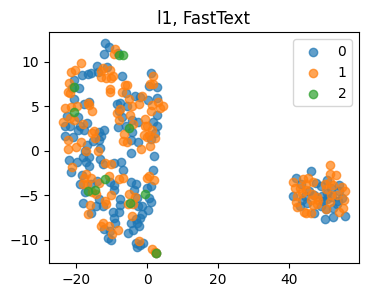

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


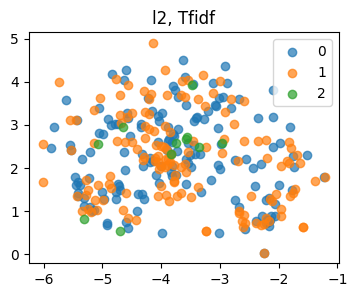

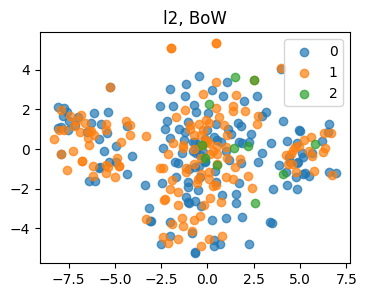

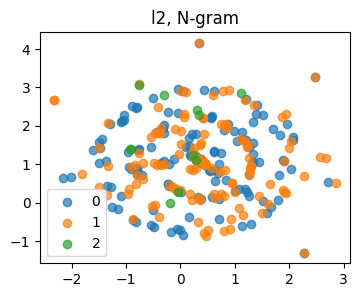

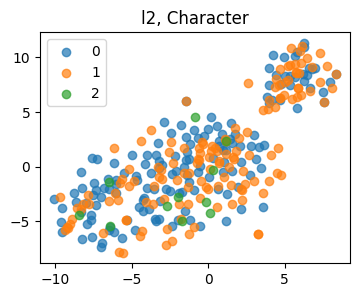

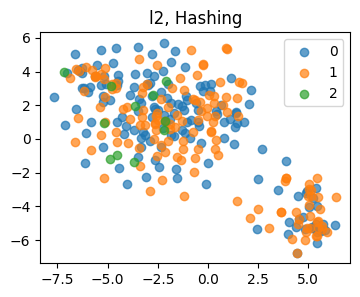

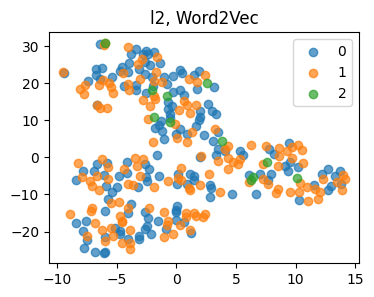

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


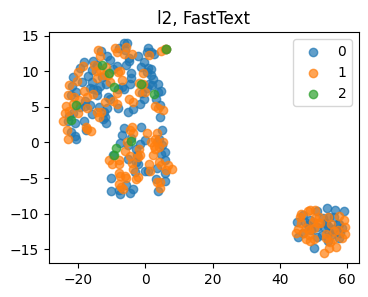

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


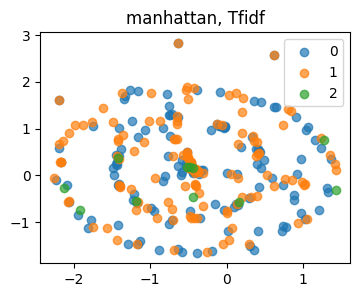

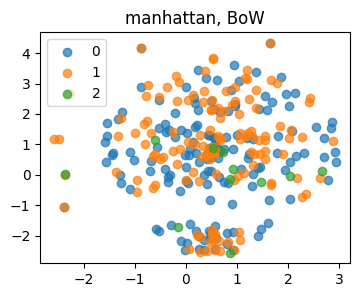

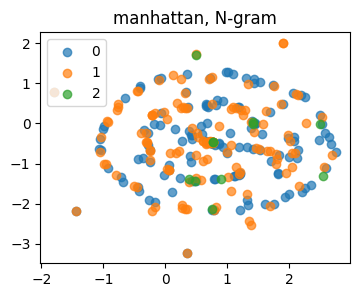

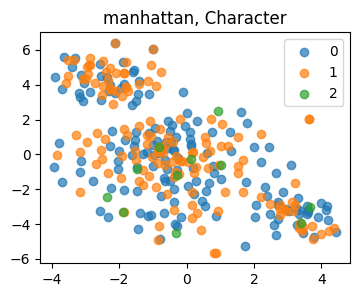

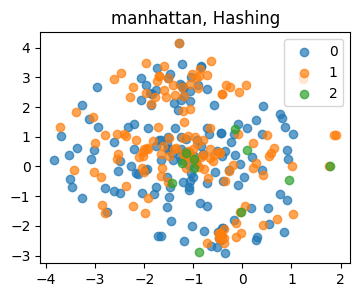

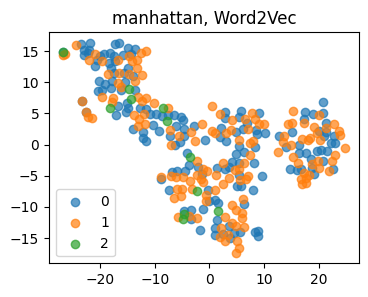

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


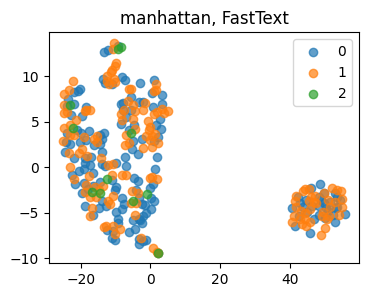

In [116]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from gensim.models import Word2Vec, FastText
from sklearn.feature_extraction.text import CountVectorizer, HashingVectorizer, TfidfVectorizer
from gensim.utils import simple_preprocess

def get_document_vectors(model, sentences):
    document_vectors = []
    for sentence in sentences:
        words = [word for word in sentence if word in model.wv]
        if words:
            document_vectors.append(np.mean(model.wv[words], axis=0))
        else:
            document_vectors.append(np.zeros(model.vector_size))
    return np.array(document_vectors)

for curmetric in ['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan']:
    tsne = TSNE(init="random", random_state=42, n_iter=10000, metric=curmetric)
    
    for vectorizer_name in ['Tfidf', 'BoW', 'N-gram', 'Character', 'Hashing', 'Word2Vec', 'FastText']:
        if vectorizer_name == 'Tfidf':
            vectorizer = TfidfVectorizer()
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'BoW':
            vectorizer = CountVectorizer()
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'N-gram':
            vectorizer = CountVectorizer(ngram_range=(2, 3))  # биграммы и триграммы
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'Character':
            vectorizer = CountVectorizer(analyzer='char', ngram_range=(3, 3))  # Например, для trigrams
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'Hashing':
            vectorizer = HashingVectorizer(n_features=2**10)
            X = vectorizer.transform(df['text'])
        elif vectorizer_name == 'Word2Vec':
            sentences = [simple_preprocess(text) for text in df['text']]
            model = Word2Vec(sentences, vector_size=100, window=5, min_count=1, workers=4)
            X = get_document_vectors(model, sentences)
        elif vectorizer_name == 'FastText':
            sentences = [simple_preprocess(text) for text in df['text']]
            model = FastText(sentences, vector_size=100, window=5, min_count=1, workers=4)
            X = get_document_vectors(model, sentences)
        
        X_tsne = tsne.fit_transform(X)
        
        fig, ax = plt.subplots(figsize=(4, 3))
        for label in [0,1,2]:
            subset = df[df['label'].apply(lambda x: x//2) == label]
            ax.scatter(X_tsne[subset.index, 0], X_tsne[subset.index, 1], alpha=0.7, label=label)
        
        plt.title(f'{curmetric}, {vectorizer_name}')
        plt.legend()
        plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


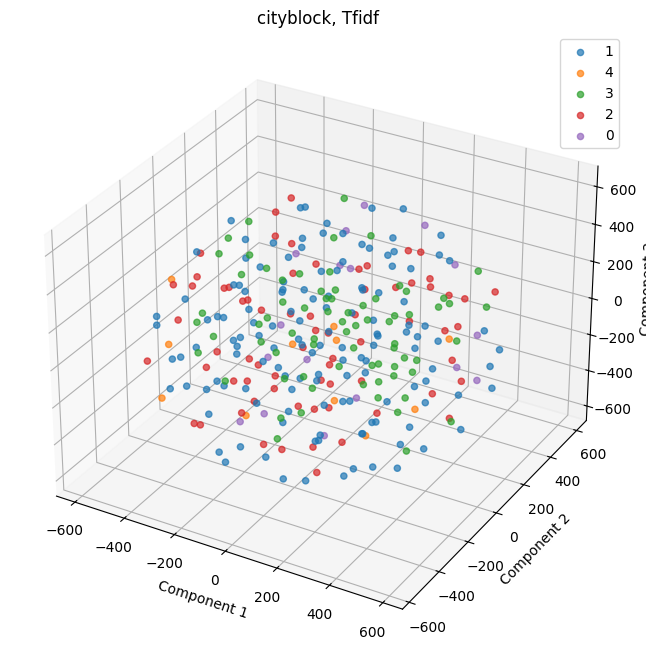

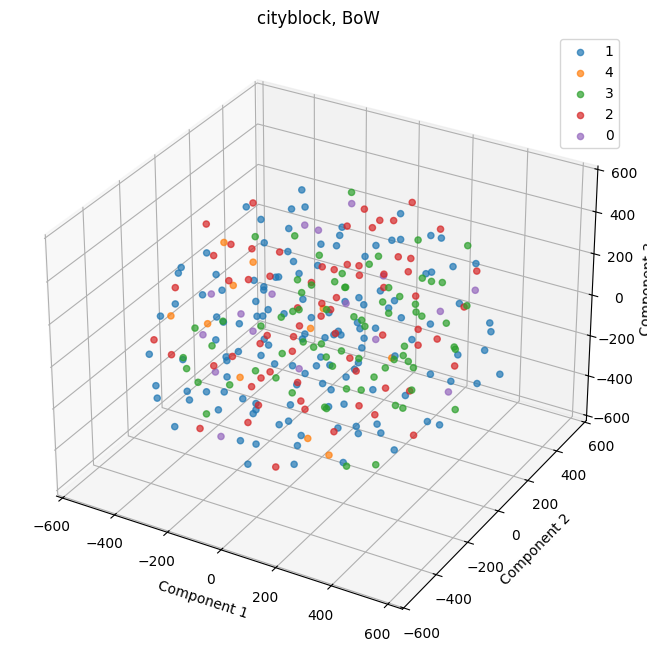

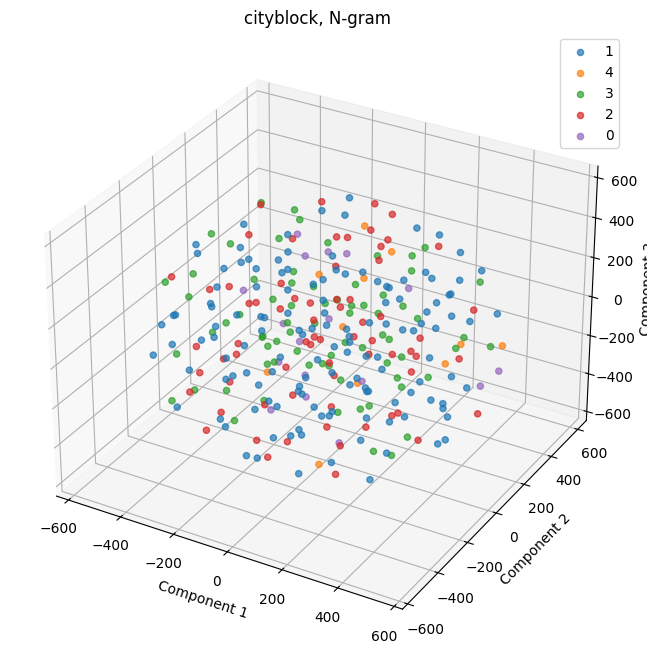

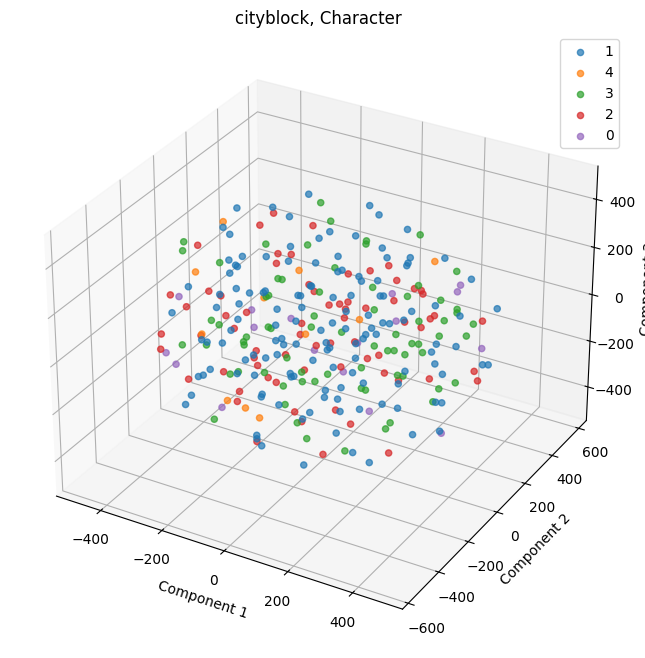

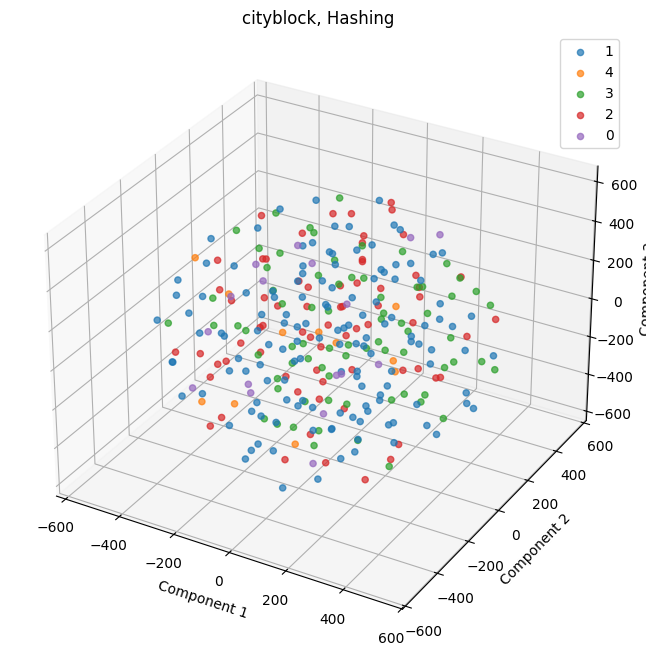

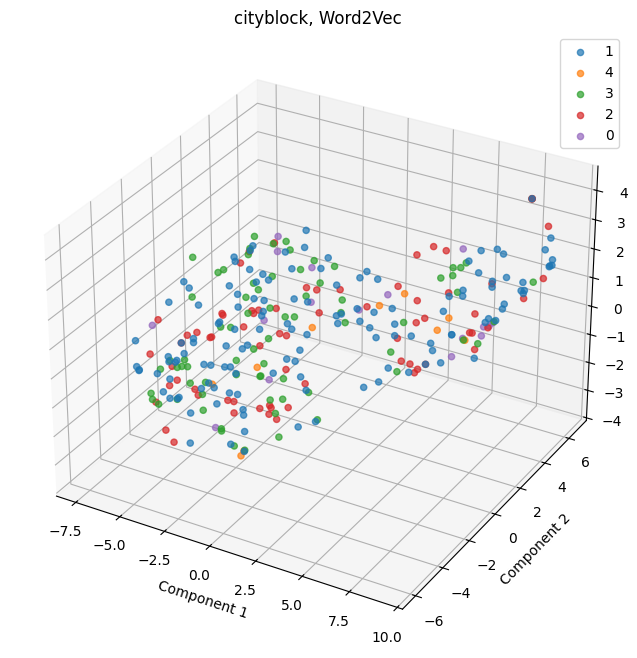

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


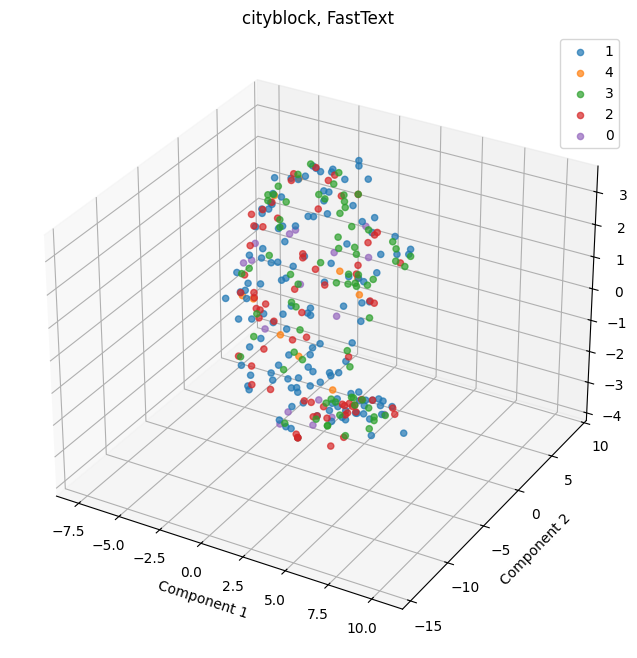

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


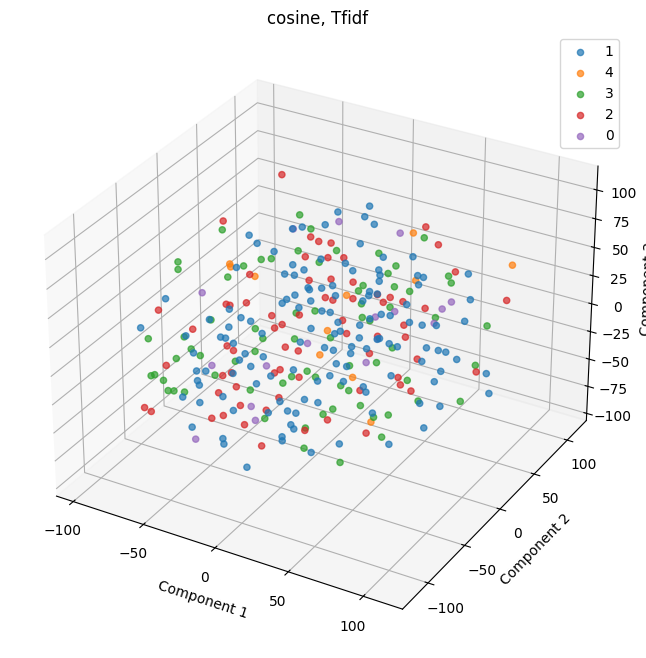

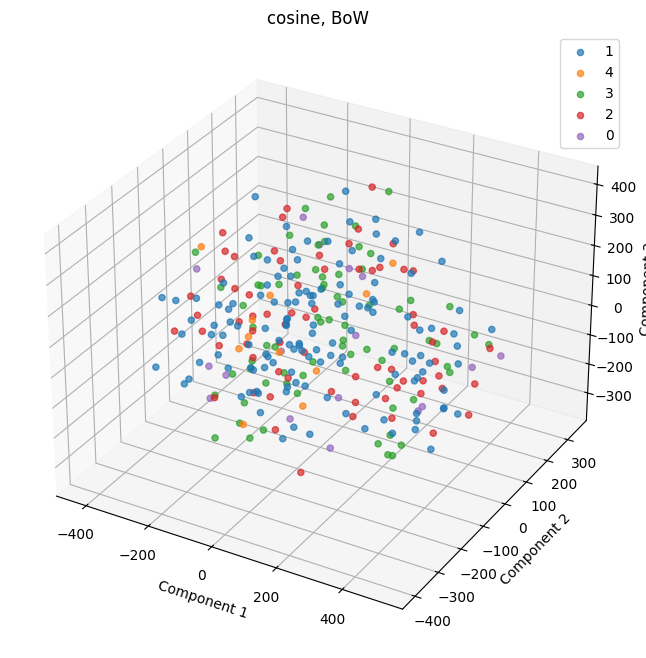

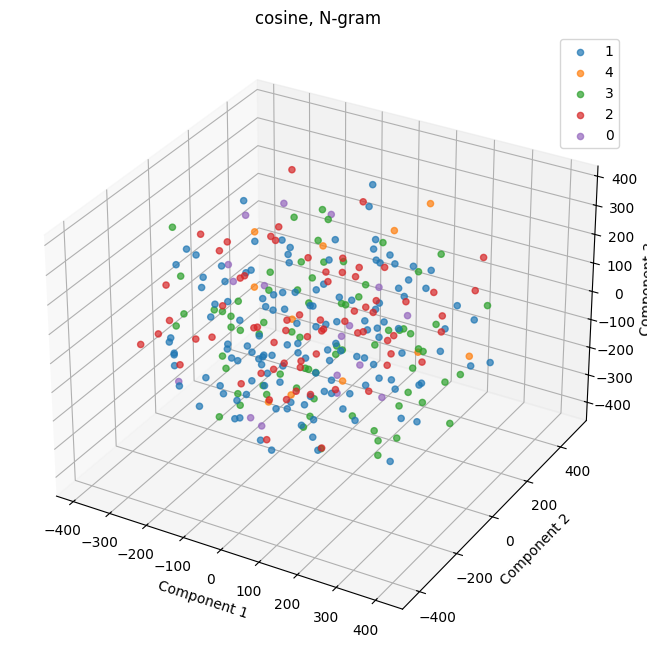

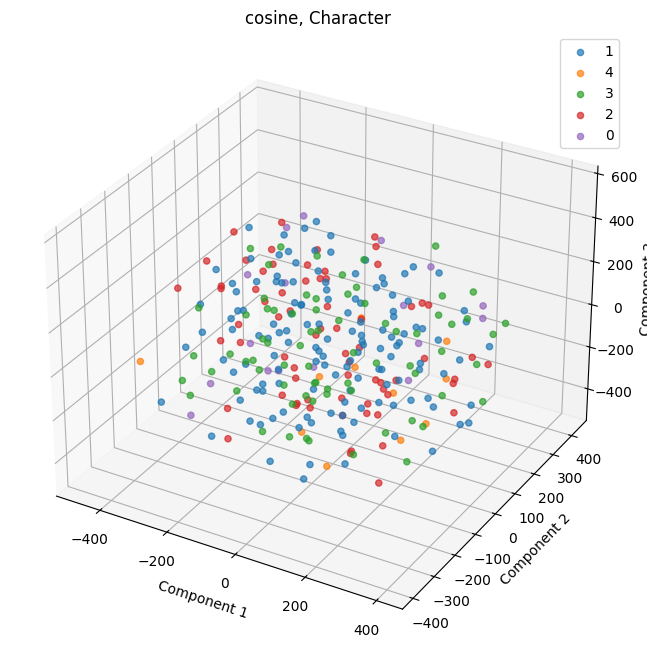

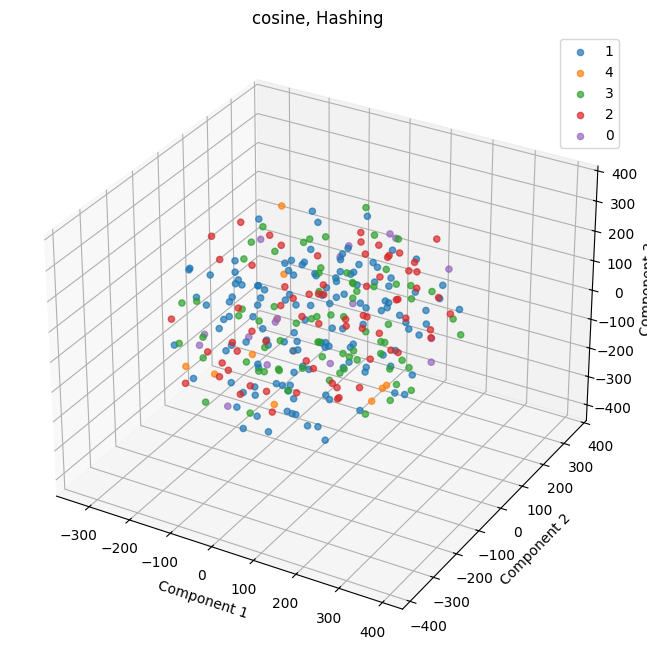

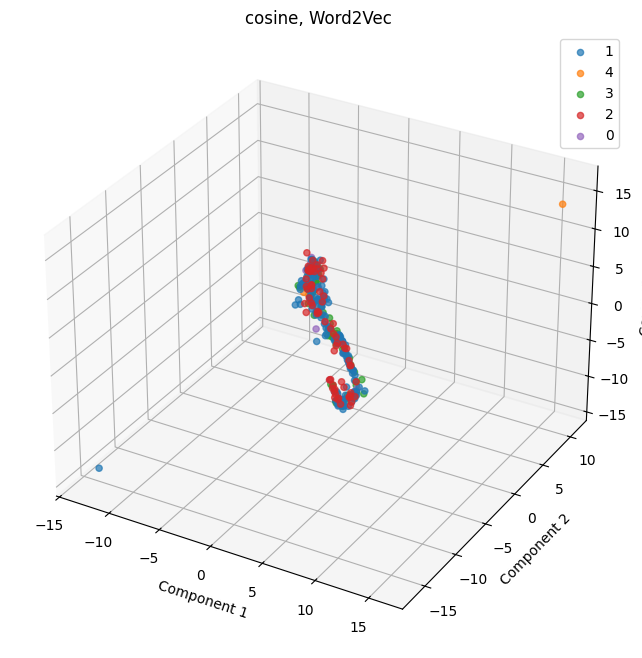

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


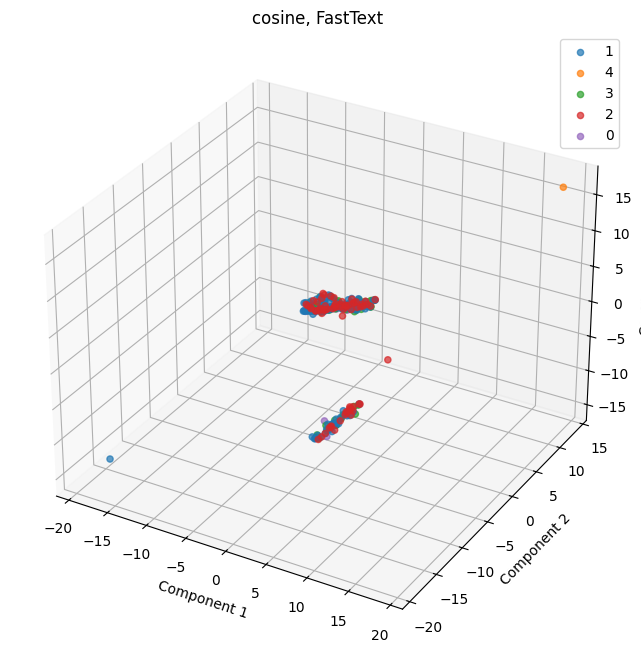

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


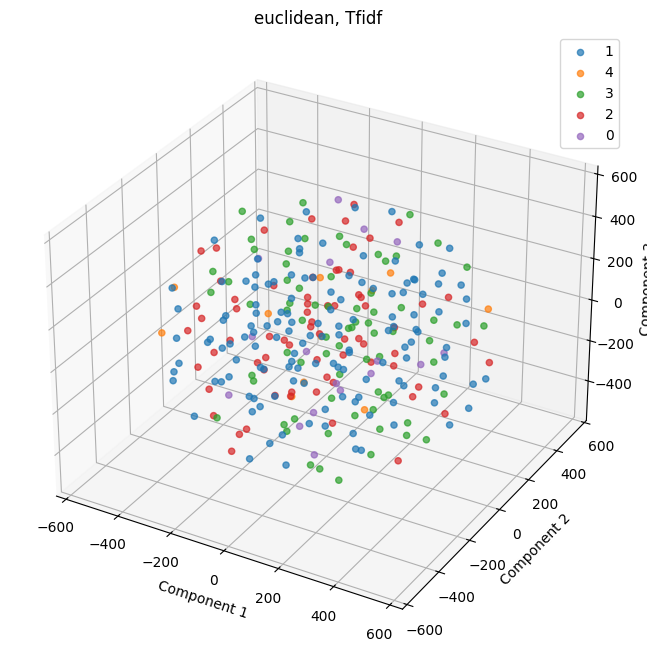

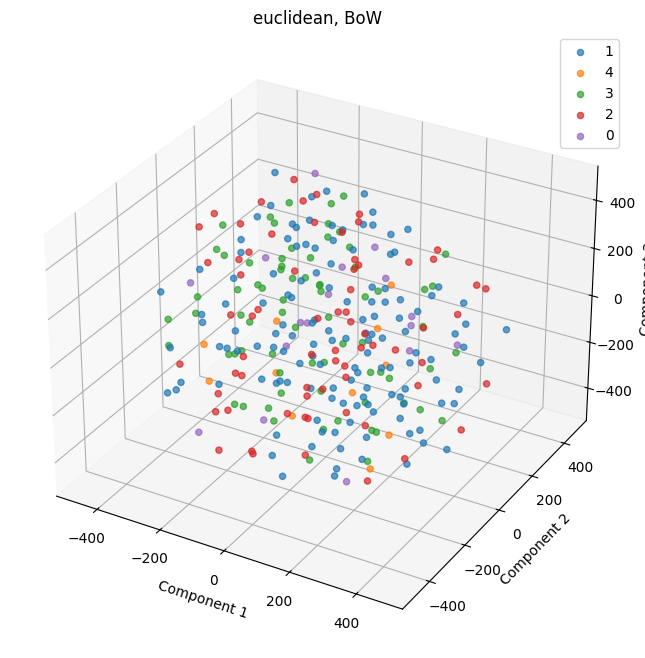

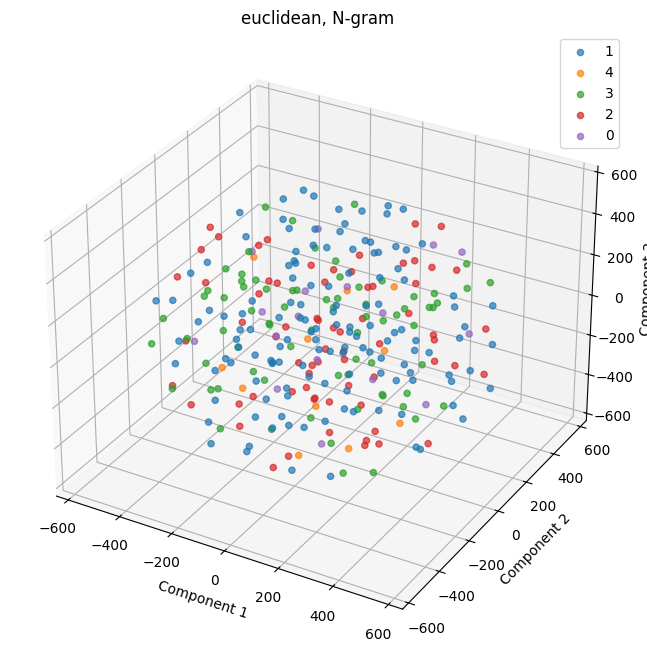

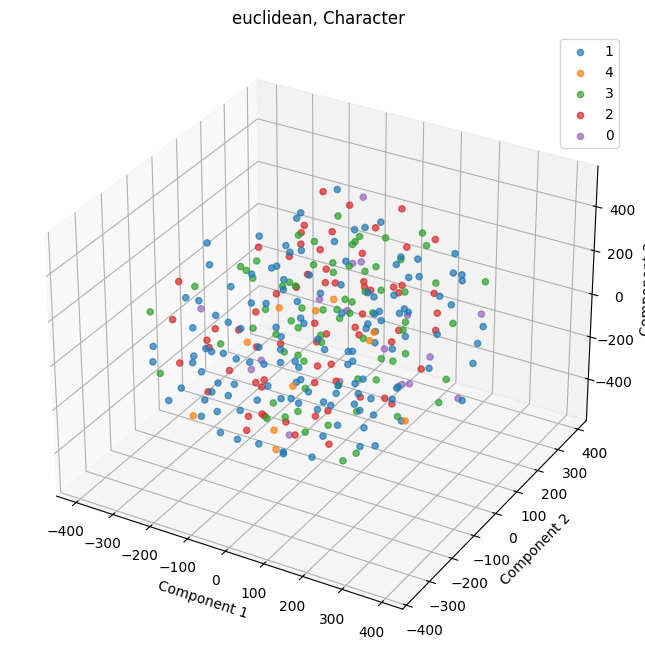

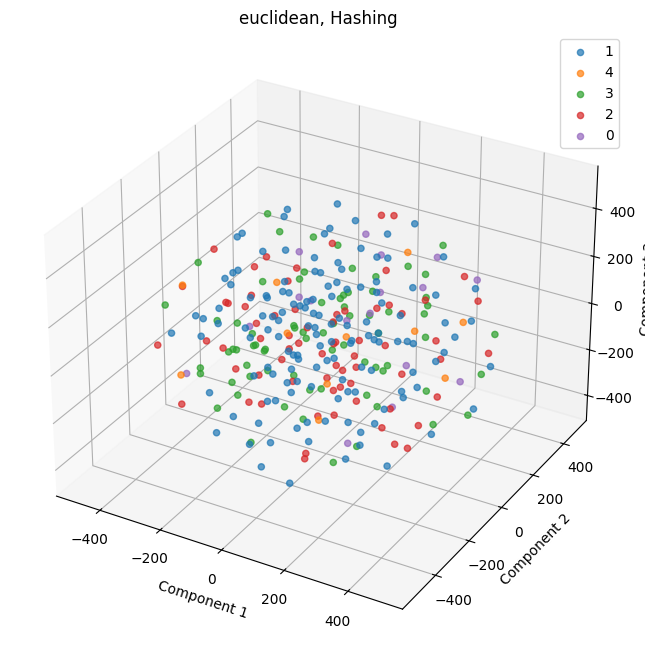

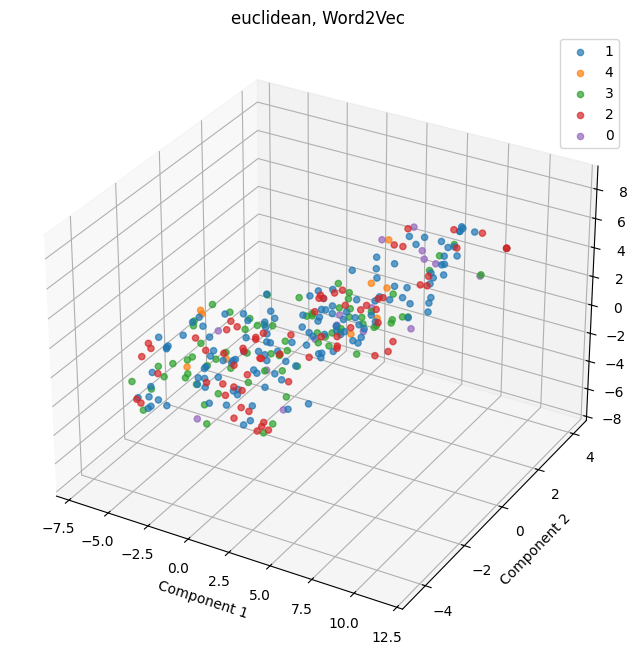

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


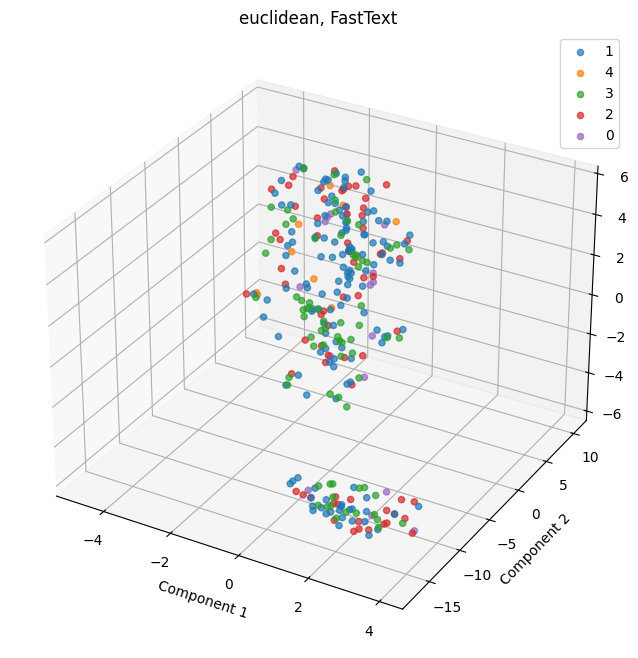

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


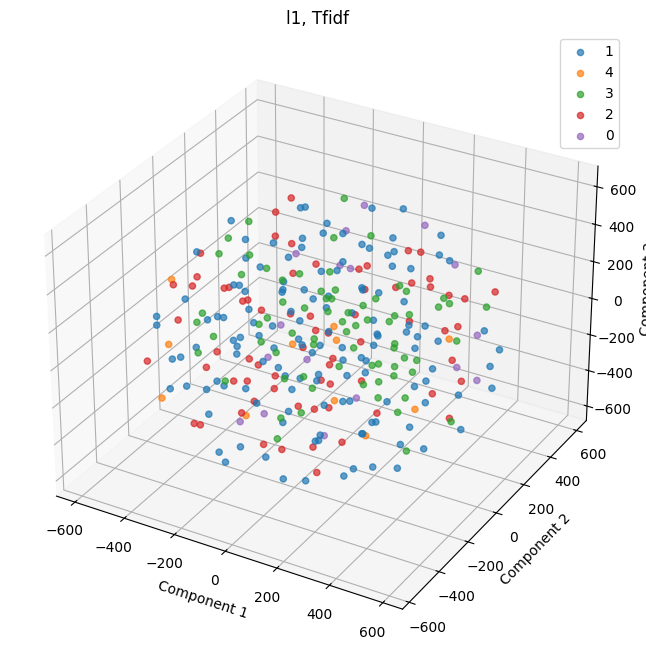

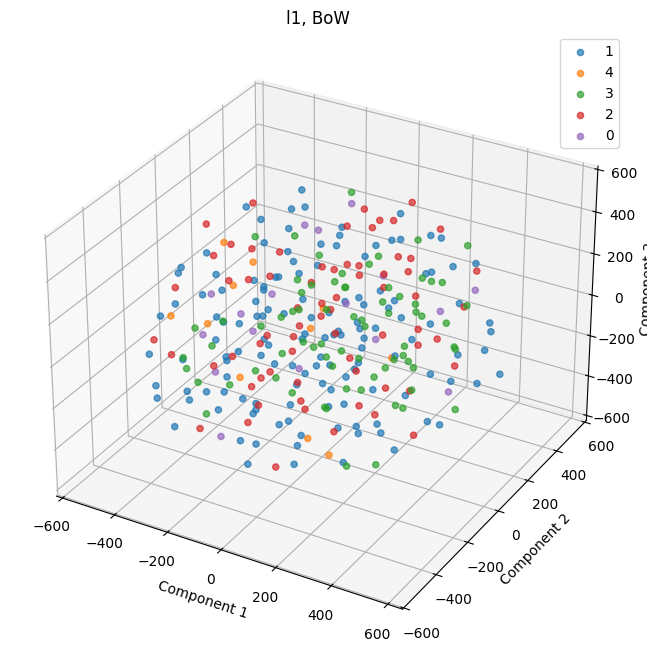

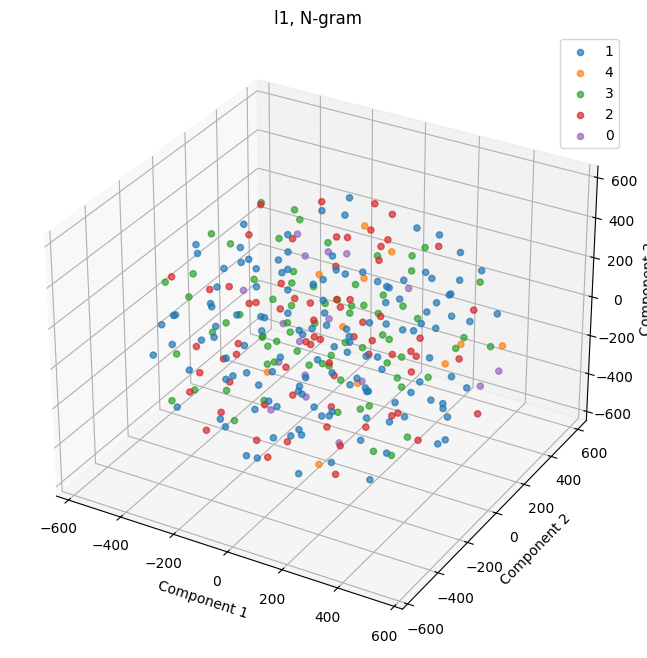

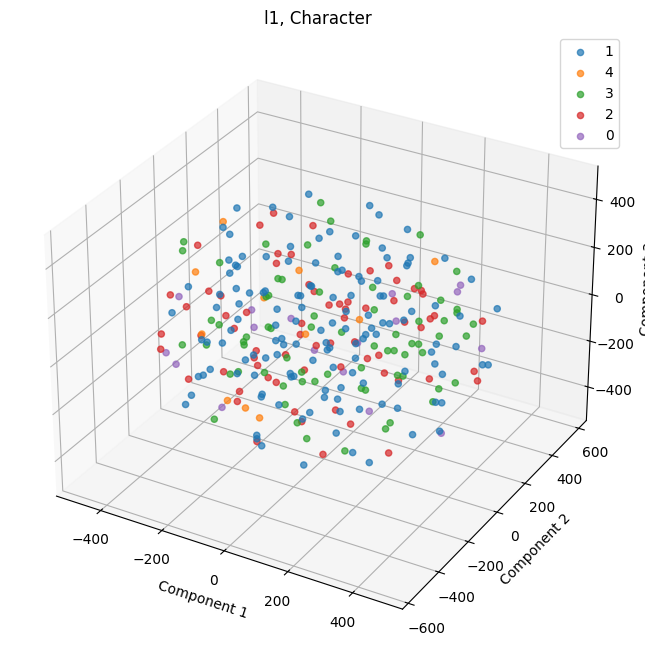

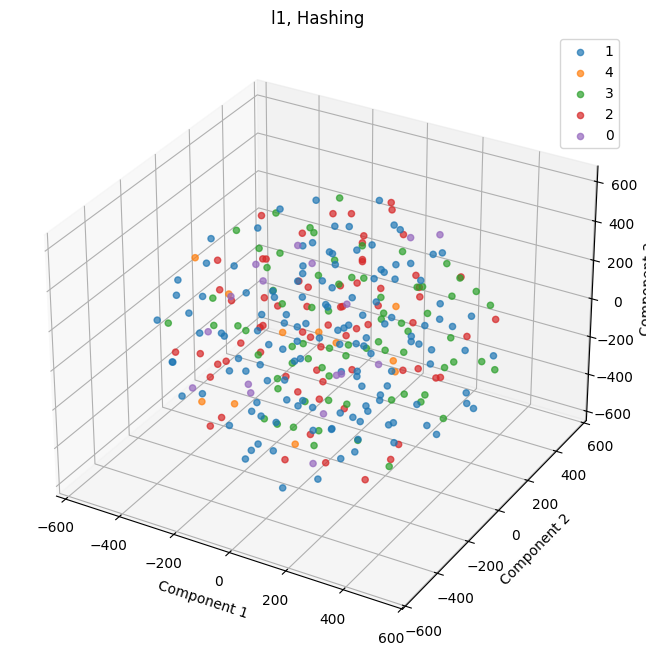

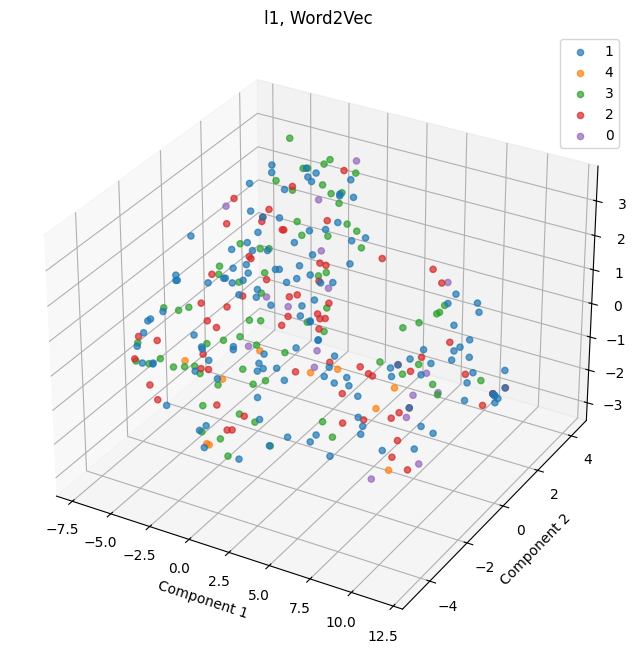

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


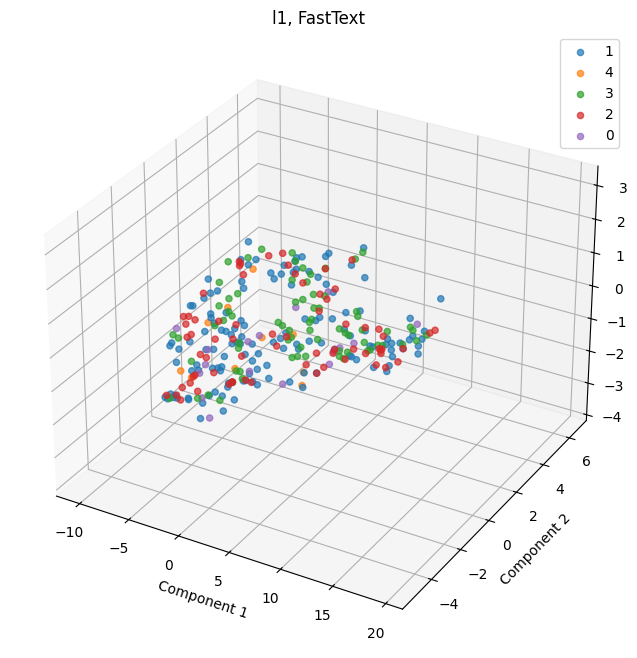

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


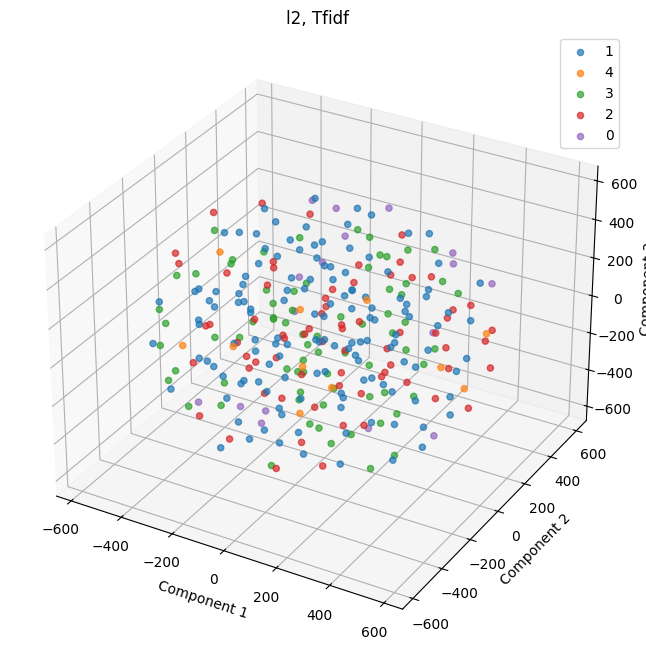

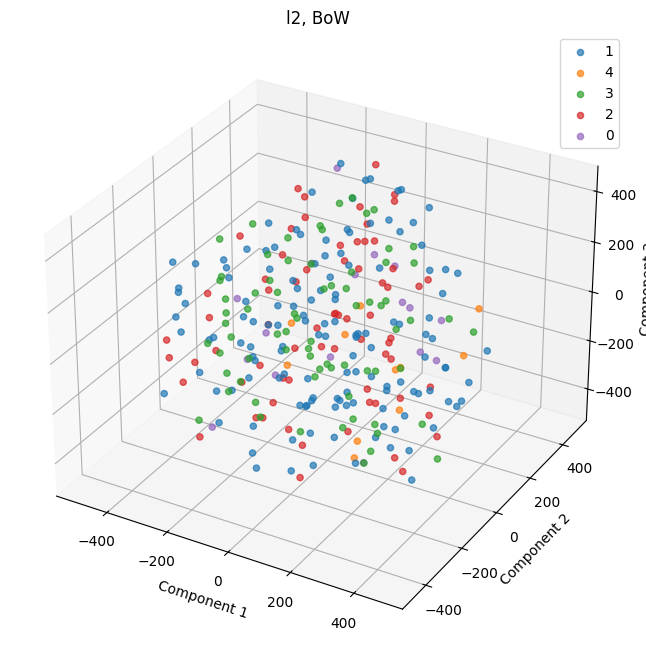

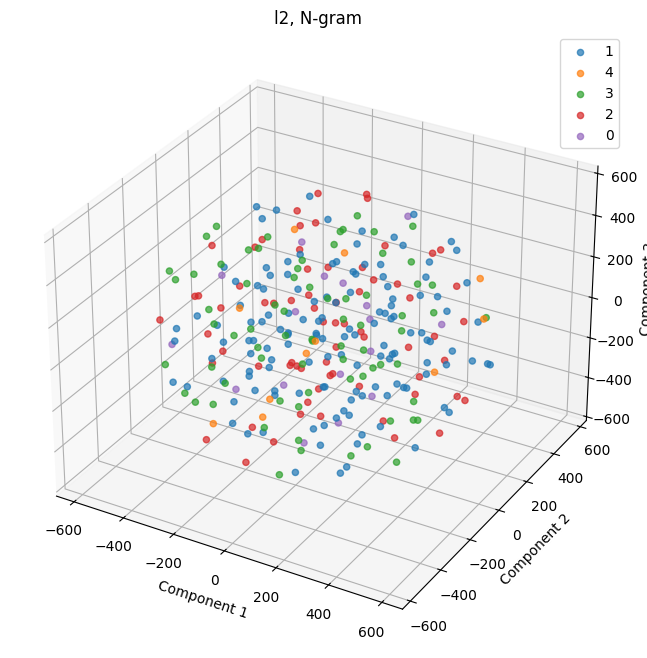

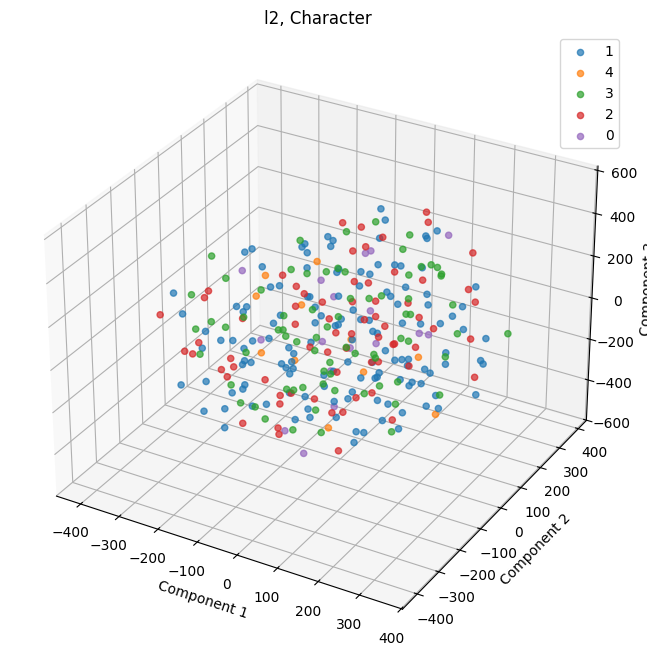

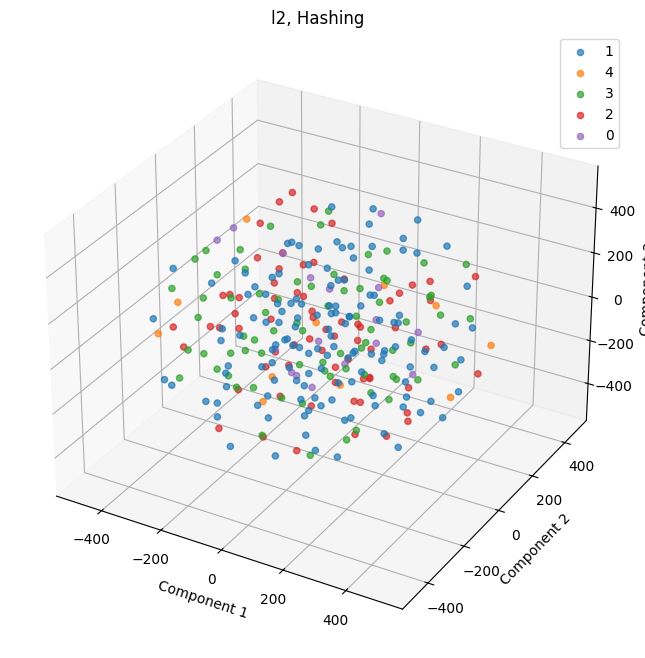

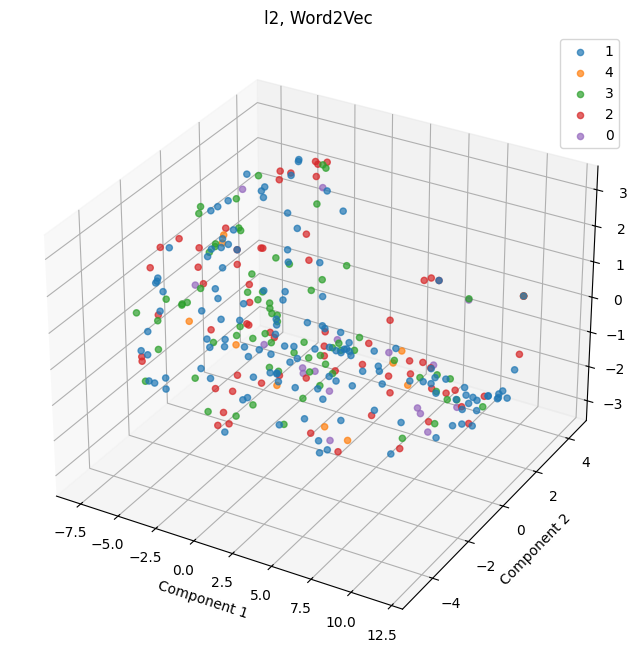

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


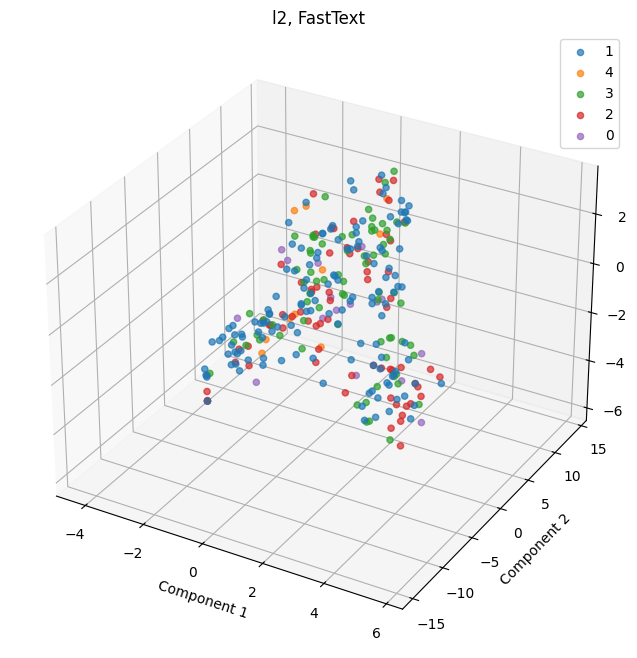

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


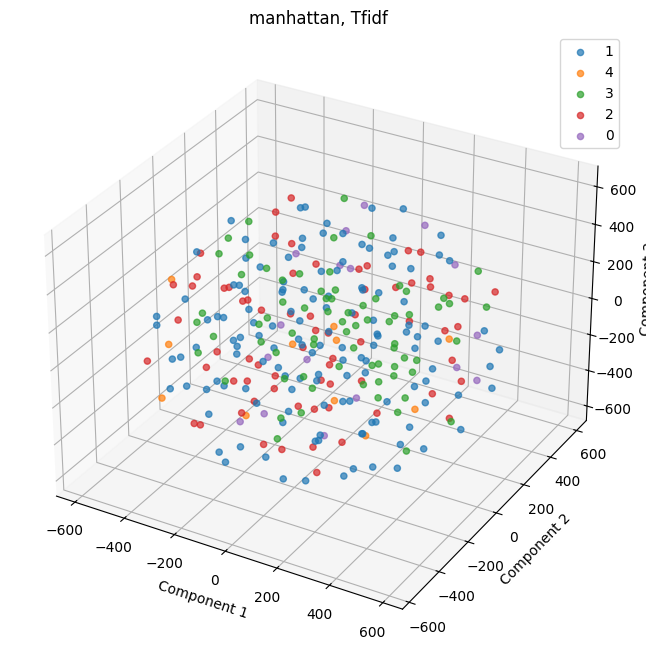

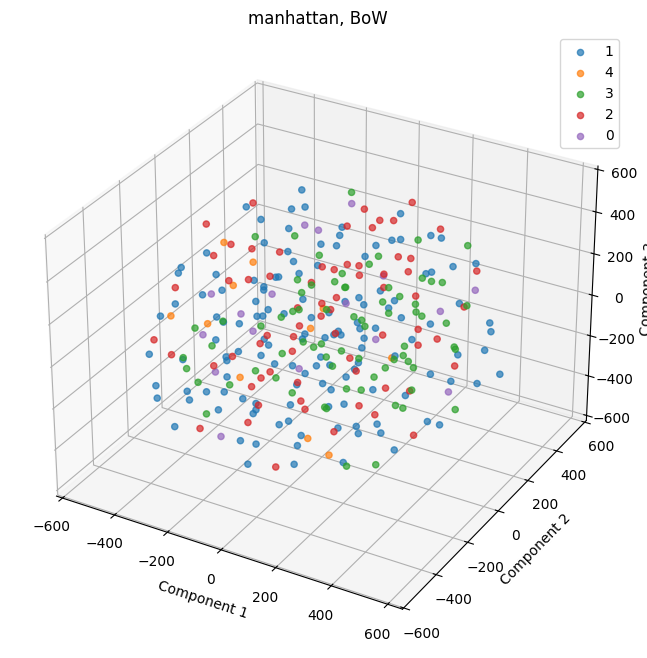

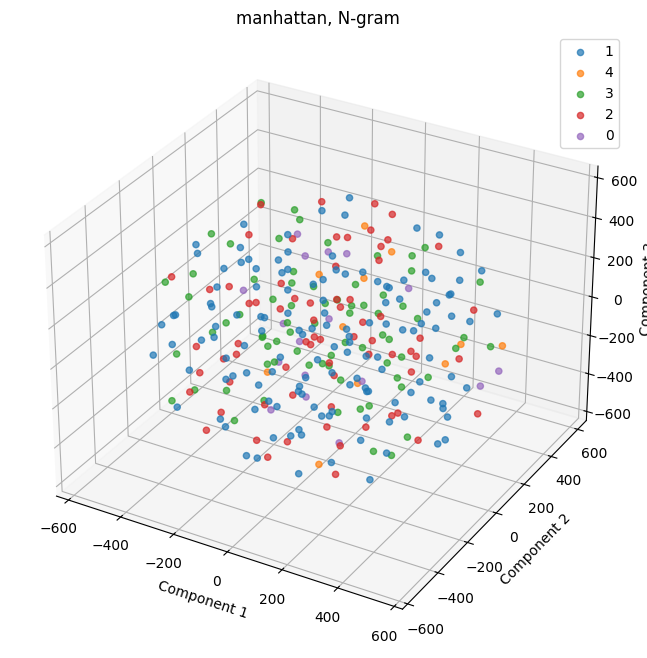

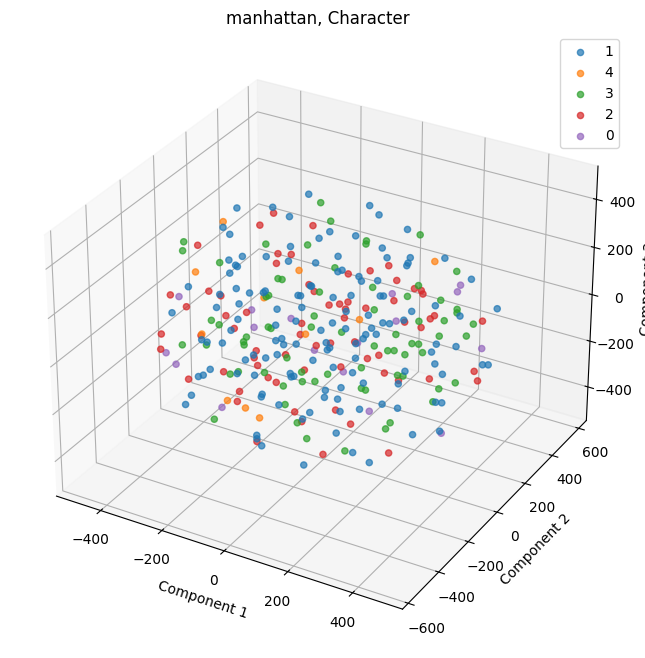

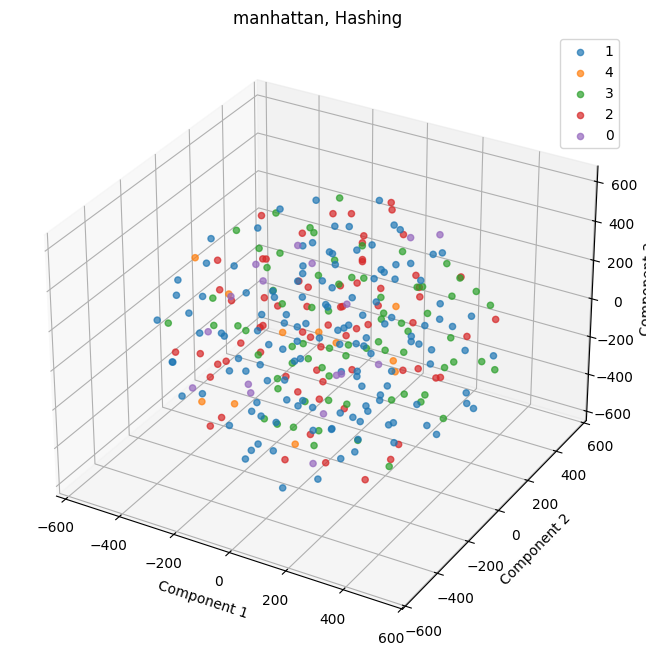

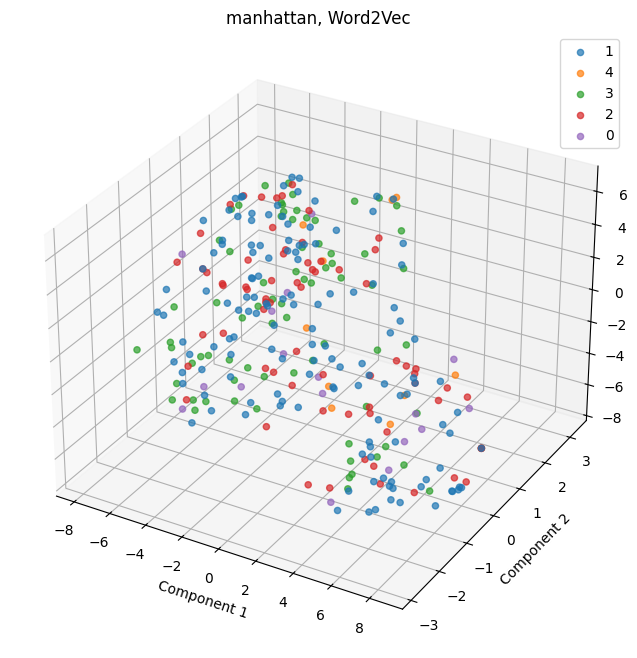

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


In [ ]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from gensim.models import Word2Vec, FastText
from sklearn.feature_extraction.text import CountVectorizer, HashingVectorizer, TfidfVectorizer
from gensim.utils import simple_preprocess

def get_document_vectors(model, sentences):
    document_vectors = []
    for sentence in sentences:
        words = [word for word in sentence if word in model.wv]
        if words:
            document_vectors.append(np.mean(model.wv[words], axis=0))
        else:
            document_vectors.append(np.zeros(model.vector_size))
    return np.array(document_vectors)

for curmetric in ['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan']:
    # Изменяем n_components на 3
    tsne = TSNE(init="random", random_state=42, n_iter=10000, metric=curmetric, n_components=3)
    
    for vectorizer_name in ['Tfidf', 'BoW', 'N-gram', 'Character', 'Hashing', 'Word2Vec', 'FastText']:
        if vectorizer_name == 'Tfidf':
            vectorizer = TfidfVectorizer()
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'BoW':
            vectorizer = CountVectorizer()
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'N-gram':
            vectorizer = CountVectorizer(ngram_range=(2, 3))
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'Character':
            vectorizer = CountVectorizer(analyzer='char', ngram_range=(3, 3))
            X = vectorizer.fit_transform(df['text'])
        elif vectorizer_name == 'Hashing':
            vectorizer = HashingVectorizer(n_features=2**10)
            X = vectorizer.transform(df['text'])
        elif vectorizer_name == 'Word2Vec':
            sentences = [simple_preprocess(text) for text in df['text']]
            model = Word2Vec(sentences, vector_size=100, window=5, min_count=1, workers=4)
            X = get_document_vectors(model, sentences)
        elif vectorizer_name == 'FastText':
            sentences = [simple_preprocess(text) for text in df['text']]
            model = FastText(sentences, vector_size=100, window=5, min_count=1, workers=4)
            X = get_document_vectors(model, sentences)
        
        X_tsne = tsne.fit_transform(X)
        
        # Создаем 3D график
        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection='3d')
        
        for label in df['label'].unique():
            subset = df[df['label'] == label]
            ax.scatter(X_tsne[subset.index, 0], X_tsne[subset.index, 1], X_tsne[subset.index, 2], alpha=0.7, label=label)
        
        ax.set_title(f'{curmetric}, {vectorizer_name}')
        ax.legend()
        plt.show()